In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format='retina'

# load global efficiency

In [2]:
hcp_globalEff_data = r'E:\gregn\data\HCP\HCP_globalEfficiency_2scan.h5'
hcp_globalEff = pd.read_hdf(hcp_globalEff_data, 'hcp_globalEff')
hcp_globalEff = hcp_globalEff.set_index(['Subject'])
print('global efficiency\nrows:  {}\ncols:    {}'.format(hcp_globalEff.shape[0], hcp_globalEff.shape[1]))
print('\ndata type value counts:')
print(hcp_globalEff.dtypes.value_counts())

global efficiency
rows:  1082
cols:    90

data type value counts:
float64    90
dtype: int64


# load open data

In [3]:
hcp_open_data = r'E:\gregn\data\HCP\HCP_OPEN.h5'
hcp_open = pd.read_hdf(hcp_open_data, 'hcp_open')
hcp_open = hcp_open.set_index(['Subject'])
print('HCP OPEN\nrows: {}\ncols:  {}'.format(hcp_open.shape[0], hcp_open.shape[1]))
print('\ndata type value counts:')
print(hcp_open.dtypes.value_counts())

HCP OPEN
rows: 1206
cols:  581

data type value counts:
float64    427
object      78
bool        48
int64       28
dtype: int64


# load restricted data

In [4]:
hcp_restricted_data = r'E:\gregn\data\HCP\HCP_RESTRICTED.h5'
hcp_restricted = pd.read_hdf(hcp_restricted_data, 'hcp_restricted')
hcp_restricted = hcp_restricted.set_index(['Subject'])
print('HCP RESTRICTED\nrows: {}\ncols:  {}'.format(hcp_restricted.shape[0], hcp_restricted.shape[1]))
print('\ndata type value counts:')
print(hcp_restricted.dtypes.value_counts())

HCP RESTRICTED
rows: 1206
cols:  200

data type value counts:
float64    177
bool         9
object       8
int64        6
dtype: int64


# join data

In [5]:
hcp = hcp_globalEff.join(hcp_open)
hcp = hcp.join(hcp_restricted)
print('HCP \nrows: {}\ncols:  {}'.format(hcp.shape[0], hcp.shape[1]))
print('\ndata type value counts:')
print(hcp.dtypes.value_counts())

HCP 
rows: 1082
cols:  871

data type value counts:
float64    694
object      86
bool        57
int64       34
dtype: int64


In [6]:
# change to datetime format 
hcp['PSQI_GetUpTime'] = pd.to_datetime(hcp['PSQI_GetUpTime']).dt.hour
hcp['PSQI_BedTime'] = pd.to_datetime(hcp['PSQI_BedTime']).dt.hour

# get dummies

In [7]:
hcp = pd.get_dummies(hcp, columns=[
    'Gender', 
    'Race', 
    'Ethnicity', 
    'ZygositySR', 
    'ZygosityGT'
])
list(hcp.select_dtypes(include='uint8').columns)

['Gender_F',
 'Gender_M',
 'Race_Am. Indian/Alaskan Nat.',
 'Race_Asian/Nat. Hawaiian/Othr Pacific Is.',
 'Race_Black or African Am.',
 'Race_More than one',
 'Race_Unknown or Not Reported',
 'Race_White',
 'Ethnicity_Hispanic/Latino',
 'Ethnicity_Not Hispanic/Latino',
 'Ethnicity_Unknown or Not Reported',
 'ZygositySR_ ',
 'ZygositySR_MZ',
 'ZygositySR_NotMZ',
 'ZygositySR_NotTwin',
 'ZygosityGT_ ',
 'ZygosityGT_DZ',
 'ZygosityGT_MZ']

# y target variable

In [8]:
hcp = hcp.dropna(subset=['SSAGA_Mj_Times_Used'])

y = hcp['SSAGA_Mj_Times_Used'].values
y = np.where(y==1, 0, y)
y = np.where(y==2, 0, y)
y = np.where(y==3, 0, y)
y = np.where(y==4, 0, y)
y = np.where(y==5, 1, y)

unique, counts = np.unique(y, return_counts=True)

print('1000x binary classification counts')
print('[0] used less than or equal to 999x:    ', counts[0])
print('[1] used more than or equal to 1000x:    ', counts[1])

print('\n\noriginal marijuana times used class counts:\n')
print(hcp['SSAGA_Mj_Times_Used'].value_counts())

1000x binary classification counts
[0] used less than or equal to 999x:     984
[1] used more than or equal to 1000x:     96


original marijuana times used class counts:

0.0    489
1.0    221
3.0    125
5.0     96
2.0     81
4.0     68
Name: SSAGA_Mj_Times_Used, dtype: int64


# X features

In [9]:
X = hcp
X = X[[
    
#########################
### GLOBAL EFFICIENCY ###
#########################
    
 'Cingulum_Ant_R',
 'Cingulum_Mid_L',
 'Cingulum_Mid_R',
 'Cingulum_Post_L',
 'Cingulum_Post_R',
 'Cuneus_L',
 'Cuneus_R',
 'Frontal_Inf_Oper_L',
 'Frontal_Inf_Oper_R',
 'Frontal_Inf_Orb_L',
 'Amygdala_L',
 'Frontal_Inf_Orb_R',
 'Frontal_Inf_Tri_L',
 'Frontal_Inf_Tri_R',
 'Frontal_Mid_Orb_L',
 'Frontal_Mid_Orb_R',
 'Frontal_Mid_L',
 'Frontal_Mid_Orb_L.1',
 'Frontal_Mid_Orb_R.1',
 'Frontal_Mid_R',
 'Frontal_Sup_L',
 'Amygdala_R',
 'Frontal_Sup_Medial_L',
 'Frontal_Sup_Medial_R',
 'Frontal_Sup_Orb_L',
 'Frontal_Sup_Orb_R',
 'Frontal_Sup_R',
 'Fusiform_L',
 'Fusiform_R',
 'Heschl_L',
 'Heschl_R',
 'Hippocampus_L',
 'Angular_L',
 'Hippocampus_R',
 'Insula_L',
 'Insula_R',
 'Lingual_L',
 'Lingual_R',
 'Occipital_Inf_L',
 'Occipital_Inf_R',
 'Occipital_Mid_L',
 'Occipital_Mid_R',
 'Occipital_Sup_L',
 'Angular_R',
 'Occipital_Sup_R',
 'Olfactory_L',
 'Olfactory_R',
 'Pallidum_L',
 'Pallidum_R',
 'ParaHippocampal_L',
 'ParaHippocampal_R',
 'Paracentral_Lobule_L',
 'Paracentral_Lobule_R',
 'Parietal_Inf_L',
 'Calcarine_L',
 'Parietal_Inf_R',
 'Parietal_Sup_L',
 'Parietal_Sup_R',
 'Postcentral_L',
 'Postcentral_R',
 'Precentral_L',
 'Precentral_R',
 'Precuneus_L',
 'Precuneus_R',
 'Putamen_L',
 'Calcarine_R',
 'Putamen_R',
 'Rectus_L',
 'Rectus_R',
 'Rolandic_Oper_L',
 'Rolandic_Oper_R',
 'Supp_Motor_Area_L',
 'Supp_Motor_Area_R',
 'SupraMarginal_L',
 'SupraMarginal_R',
 'Temporal_Inf_L',
 'Caudate_L',
 'Temporal_Inf_R',
 'Temporal_Mid_L',
 'Temporal_Mid_R',
 'Temporal_Pole_Mid_L',
 'Temporal_Pole_Mid_R',
 'Temporal_Pole_Sup_L',
 'Temporal_Pole_Sup_R',
 'Temporal_Sup_L',
 'Temporal_Sup_R',
 'Thalamus_L',
 'Caudate_R',
 'Thalamus_R',
 'Cingulum_Ant_L',
    
    
### OPEN HCP ###
    

#################
### ALERTNESS ### 
#################
    
 'MMSE_Score', # Cognitive Status (Mini Mental Status Exam)
 'PSQI_Score', # Sleep (Pittsburgh Sleep Questionnaire)
 'PSQI_Comp1',
 'PSQI_Comp2',
 'PSQI_Comp3',
 'PSQI_Comp4',
 'PSQI_Comp5',
 'PSQI_Comp6',
 'PSQI_Comp7',
 'PSQI_Min2Asleep',
 'PSQI_AmtSleep',
 'PSQI_Latency30Min',
 'PSQI_WakeUp',
 'PSQI_Bathroom',
 'PSQI_Breathe',
 'PSQI_Snore',
 'PSQI_TooCold',
 'PSQI_TooHot',
 'PSQI_BadDream',
 'PSQI_Pain',
 'PSQI_Other',
 'PSQI_Quality',
 'PSQI_SleepMeds',
 'PSQI_DayStayAwake',
 'PSQI_DayEnthusiasm',
 'PSQI_BedPtnrRmate',
 'PSQI_GetUpTime',
 'PSQI_BedTime',

#################
### COGNITION ###
#################
    

 'PicSeq_AgeAdj', # Episodic Memory (Picture Sequence Memory) 
 'CardSort_AgeAdj', # Executive Function/Cognitive Flexibility (Dimensional Change Card Sort) 
 'Flanker_AgeAdj', # Executive Function/Inhibition (Flanker Task) 
 'PMAT24_A_CR', # Fluid Intelligence (Penn Progressive Matrices)
 'PMAT24_A_SI', # Fluid Intelligence (Penn Progressive Matrices)
 'PMAT24_A_RTCR', # Fluid Intelligence (Penn Progressive Matrices)
 'ReadEng_AgeAdj', # Language/Reading Decoding (Oral Reading Recognition)
 'PicVocab_AgeAdj', # Language/Vocabulary Comprehension (Picture Vocabulary)
 'ProcSpeed_AgeAdj', # Processing Speed (Pattern Completion Processing Speed)
 'DDisc_SV_1mo_200', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_6mo_200', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_1yr_200', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_3yr_200', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_5yr_200', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_10yr_200', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_1mo_40K', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_6mo_40K', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_1yr_40K', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_3yr_40K', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_5yr_40K', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_SV_10yr_40K', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_AUC_200', # Self-regulation/Impulsivity (Delay Discounting)
 'DDisc_AUC_40K', # Self-regulation/Impulsivity (Delay Discounting)
 'VSPLOT_TC', # Spatial Orientation (Variable Short Penn Line Orientation Test)
 'VSPLOT_CRTE', # Spatial Orientation (Variable Short Penn Line Orientation Test)
 'VSPLOT_OFF', # Spatial Orientation (Variable Short Penn Line Orientation Test)
 'SCPT_TP', # Sustained Attention (Short Penn Continuous Performance Test)
 'SCPT_TN', # Sustained Attention (Short Penn Continuous Performance Test)
 'SCPT_FP', # Sustained Attention (Short Penn Continuous Performance Test)
 'SCPT_FN', # Sustained Attention (Short Penn Continuous Performance Test)
 'SCPT_TPRT', # Sustained Attention (Short Penn Continuous Performance Test)
 'SCPT_SEN', # Sustained Attention (Short Penn Continuous Performance Test)
 'SCPT_SPEC', # Sustained Attention (Short Penn Continuous Performance Test)
 'SCPT_LRNR', # Sustained Attention (Short Penn Continuous Performance Test)
 'IWRD_TOT', # Verbal Episodic Memory (Penn Word Memory Test)
 'IWRD_RTC', # Verbal Episodic Memory (Penn Word Memory Test)
 'ListSort_AgeAdj', # Working Memory (List Sorting)
 'CogFluidComp_AgeAdj', # Cognition Fluid Composite
 'CogEarlyComp_AgeAdj', # Cognition Early Childhood Composite
 'CogTotalComp_AgeAdj', # Cognition Total Composite Score
 'CogCrystalComp_AgeAdj', # Cognition Crystallized Composite

###############
### EMOTION ###
###############
    
 'ER40_CR', # Emotion Recognition (Penn Emotion Recognition Test)
 'ER40_CRT', # Emotion Recognition (Penn Emotion Recognition Test)
 'ER40ANG', # Emotion Recognition (Penn Emotion Recognition Test)
 'ER40FEAR', # Emotion Recognition (Penn Emotion Recognition Test)
 'ER40HAP', # Emotion Recognition (Penn Emotion Recognition Test)
 'ER40NOE', # Emotion Recognition (Penn Emotion Recognition Test)
 'ER40SAD', # Emotion Recognition (Penn Emotion Recognition Test)
 'AngAffect_Unadj', # Negative Affect
 'AngHostil_Unadj', # Negative Affect 
 'AngAggr_Unadj', # Negative Affect 
 'FearAffect_Unadj', # Negative Affect 
 'FearSomat_Unadj', # Negative Affect 
 'Sadness_Unadj', # Negative Affect 
 'LifeSatisf_Unadj', # Psychological Well-being
 'MeanPurp_Unadj', # Psychological Well-being
 'PosAffect_Unadj', # Psychological Well-being
 'Friendship_Unadj', # Social Relationships
 'Loneliness_Unadj', # Social Relationships
 'PercHostil_Unadj', # Social Relationships
 'PercReject_Unadj', # Social Relationships
 'EmotSupp_Unadj', # Social Relationships
 'InstruSupp_Unadj', # Social Relationships
 'PercStress_Unadj', # Stress and Self Efficacy
 'SelfEff_Unadj', # Stress and Self Efficacy

###################################
### IN-SCANNER TASK PERFORMANCE ###
###################################
    
 'Emotion_Task_Acc', # Average accuracy Percentage during EMOTION task
 'Emotion_Task_Median_RT', # Average of median Reaction Times from each condition in EMOTION task
 'Emotion_Task_Face_Acc', # Accuracy Percentage during FACE blocks in EMOTION task
 'Emotion_Task_Face_Median_RT', # Median Reaction Time for correct trials during FACE blocks in EMOTION task
 'Emotion_Task_Shape_Acc', # Accuracy Percentage during SHAPE blocks in EMOTION task
 'Emotion_Task_Shape_Median_RT', # Median Reaction Time for correct trials during SHAPE blocks in EMOTION task
 'Gambling_Task_Perc_Larger', # Overall Percentage of Trials that received a 'larger' prediction in GAMBLING task
 'Gambling_Task_Perc_Smaller', # Overall Percentage of Trials that received a 'smaller' prediction in GAMBLING task
 'Gambling_Task_Perc_NLR', # Overall Percentage of Trials with no response logged in GAMBLING task
 'Gambling_Task_Median_RT_Larger', # Average of Median Reaction Times from Trials that received a 'larger' prediction in GAMBLING task
 'Gambling_Task_Median_RT_Smaller', # Average of Median Reaction Times from Trials that received a 'smaller' prediction in GAMBLING task
 'Gambling_Task_Reward_Perc_Larger', # Percentage of Reward Trials that received a 'larger' prediction in GAMBLING task
 'Gambling_Task_Reward_Median_RT_Larger', # Median Reaction Time for Reward Trials that received a 'larger' prediction in GAMBLING task
 'Gambling_Task_Reward_Perc_Smaller', # Percentage of Reward Trials that received a 'smaller' prediction in GAMBLING task
 'Gambling_Task_Reward_Median_RT_Smaller', # Median Reaction Time for Reward Trials that received a 'smaller' prediction in GAMBLING task
 'Gambling_Task_Reward_Perc_NLR', # Percentage of Reward Trials with no response logged in GAMBLING task
 'Gambling_Task_Punish_Perc_Larger', # Percentage of Punish Trials that received a 'larger' prediction in GAMBLING task
 'Gambling_Task_Punish_Median_RT_Larger', # Median Reaction Time for Punish Trials that received a 'larger' prediction in GAMBLING task
 'Gambling_Task_Punish_Perc_Smaller', # Percentage of Punish Trials that received a 'smaller' prediction in GAMBLING task
 'Gambling_Task_Punish_Median_RT_Smaller', # Median Reaction Time for Punish Trials that received a 'smaller' prediction in GAMBLING task
 'Gambling_Task_Punish_Perc_NLR', # Percentage of Punish Trials with no response logged in GAMBLING task
 'Language_Task_Acc', # Average of accuracy from each condition in the LANGUAGE task
 'Language_Task_Median_RT', # Average of median correct Reaction Time from each condition in LANGUAGE task
 'Language_Task_Story_Acc', # Accuracy Percentage during STORY condition in LANGUAGE task
 'Language_Task_Story_Median_RT', # Median Reaction Time for correct trials during STORY condition in LANGUAGE task
 'Language_Task_Story_Avg_Difficulty_Level', # Average difficulty level of stimuli presented during STORY condition in LANGUAGE task
 'Language_Task_Math_Acc', # Accuracy Percentage during MATH condition in LANGUAGE task
 'Language_Task_Math_Median_RT', # Median Reaction Time for correct trials during MATH condition in LANGUAGE task
 'Language_Task_Math_Avg_Difficulty_Level', # Average difficulty level of stimuli presented during MATH condition in LANGUAGE task
 'Relational_Task_Acc', # Average accuracy Percentage during RELATIONAL task
 'Relational_Task_Median_RT', # Average of median Reaction Times from each condition in RELATIONAL task
 'Relational_Task_Match_Acc', # Accuracy Percentage during MATCH blocks in RELATIONAL task
 'Relational_Task_Match_Median_RT', # Median Reaction Time for correct trials during MATCH blocks in RELATIONAL task
 'Relational_Task_Rel_Acc', # Accuracy Percentage during RELATIONAL blocks in RELATIONAL task
 'Relational_Task_Rel_Median_RT', # Median Reaction Time for correct trials during RELATIONAL blocks in RELATIONAL task 
 'Social_Task_Perc_Random', # Overall Percentage of stimuli that the subject rated as 'random' in SOCIAL task
 'Social_Task_Perc_TOM', # Overall Percentage of stimuli that received a 'social' (theory of mind) rating in SOCIAL task
 'Social_Task_Perc_Unsure', # Overall Percentage of stimuli that received a 'unsure' rating in SOCIAL task
 'Social_Task_Perc_NLR', # Overall Percentage of stimuli with no response logged in SOCIAL task
 'Social_Task_Median_RT_Random', # Average of Median Reaction Times from stimuli that the subject rated as 'random' in SOCIAL task
 'Social_Task_Median_RT_TOM', # Average of Median Reaction Times from stimuli that received a 'social' (theory of mind) rating in SOCIAL task
 'Social_Task_Median_RT_Unsure', # Average of Median Reaction Times from stimuli that received an 'unsure' rating in SOCIAL task
 'Social_Task_Random_Perc_Random', # Percentage of Random stimuli that the subject rated as 'random' in SOCIAL task
 'Social_Task_Random_Median_RT_Random', # Median Reaction Time for Random stimuli that the subject rated as 'random' in SOCIAL task
 'Social_Task_Random_Perc_TOM', # Percentage of stimuli that received a 'social' (theory of mind) rating in SOCIAL task
 'Social_Task_Random_Median_RT_TOM', # Median Reaction Time for Random stimuli that received a 'social' (theory of mind) rating in SOCIAL task
 'Social_Task_Random_Perc_Unsure', # Percentage of Random stimuli that received a 'unsure' rating in SOCIAL task
 'Social_Task_Random_Median_RT_Unsure', # Median Reaction Time for Random stimuli that received a 'unsure' rating in SOCIAL task
 'Social_Task_Random_Perc_NLR', # Percentage of Random stimuli with no response logged in SOCIAL task
 'Social_Task_TOM_Perc_Random', # Percentage of Social (TOM) stimuli that the subject rated as 'random' in SOCIAL task
 'Social_Task_TOM_Median_RT_Random', # Median Reaction Time for Social (TOM) stimuli that the subject rated as 'random' in SOCIAL task
 'Social_Task_TOM_Perc_TOM', # Percentage of Social (TOM) stimuli that received a 'social' rating in SOCIAL task
 'Social_Task_TOM_Median_RT_TOM', # Median Reaction Time for Social (TOM) stimuli that received a 'social' rating in SOCIAL task
 'Social_Task_TOM_Perc_Unsure', # Percentage of Social (TOM) stimuli that received a 'unsure' rating in SOCIAL task
 'Social_Task_TOM_Median_RT_Unsure', # Median Reaction Time for Social (TOM) stimuli that received a 'unsure' rating in SOCIAL task
 'Social_Task_TOM_Perc_NLR', # Percentage of Social (TOM) stimuli with no response logged in SOCIAL task
 'WM_Task_Acc', # Accuracy across all conditions in WM task
 'WM_Task_Median_RT', # Average of Median Reaction Time for all conditions in WM task
 'WM_Task_2bk_Acc', # Accuracy across all conditions in 2-back
 'WM_Task_2bk_Median_RT', # Average of Median Reaction Time for all conditions in 2-back
 'WM_Task_0bk_Acc', # Accuracy across all conditions in 0-back
 'WM_Task_0bk_Median_RT', # Average of Median Reaction Time for all conditions in 0-back
 'WM_Task_0bk_Body_Acc', # Accuracy across all trials in 0-back body condition
 'WM_Task_0bk_Body_Acc_Target', # Accuracy across target trials in 0-back body condition
 'WM_Task_0bk_Body_Acc_Nontarget', # Accuracy across nontarget trials in 0-back body condition
 'WM_Task_0bk_Face_Acc', # Accuracy across all trials in 0-back face condition
 'WM_Task_0bk_Face_Acc_Target', # Accuracy across target trials in 0-back face condition
 'WM_Task_0bk_Face_ACC_Nontarget', # Accuracy across nontarget trials in 0-back face condition
 'WM_Task_0bk_Place_Acc', # Accuracy across all trials in 0-back place condition
 'WM_Task_0bk_Place_Acc_Target', # Accuracy across target trials in 0-back place condition
 'WM_Task_0bk_Place_Acc_Nontarget', # Accuracy across nontarget trials in 0-back place condition
 'WM_Task_0bk_Tool_Acc', # Accuracy across all trials in 0-back tool condition
 'WM_Task_0bk_Tool_Acc_Target', # Accuracy across target trials in 0-back tool condition
 'WM_Task_0bk_Tool_Acc_Nontarget', # Accuracy across nontarget trials in 0-back tool condition
 'WM_Task_2bk_Body_Acc', # Accuracy across all trials in 2-back body condition
 'WM_Task_2bk_Body_Acc_Target', # Accuracy across target trials in 2-back body condition
 'WM_Task_2bk_Body_Acc_Nontarget', # Accuracy across nontarget trials in 2-back body condition
 'WM_Task_2bk_Face_Acc', # Accuracy across all trials in 2-back face condition
 'WM_Task_2bk_Face_Acc_Target', # Accuracy across target trials in 2-back face condition
 'WM_Task_2bk_Face_Acc_Nontarget', # Accuracy across nontarget trials in 2-back face condition
 'WM_Task_2bk_Place_Acc', # Accuracy across all trials in 2-back place condition
 'WM_Task_2bk_Place_Acc_Target', # Accuracy across target trials in 2-back place condition
 'WM_Task_2bk_Place_Acc_Nontarget', # Accuracy across nontarget trials in 2-back place condition
 'WM_Task_2bk_Tool_Acc', # Accuracy across all trials in 2-back tool condition
 'WM_Task_2bk_Tool_Acc_Target', # Accuracy across target trials in 2-back tool condition
 'WM_Task_2bk_Tool_Acc_Nontarget', # Accuracy across nontarget trials in 2-back tool condition
 'WM_Task_0bk_Body_Median_RT', # Median Reaction Time across all correct trials in 0-back body condition
 'WM_Task_0bk_Body_Median_RT_Target', # Median Reaction Time across correct target trials in 0-back body condition
 'WM_Task_0bk_Body_Median_RT_Nontarget', # Median Reaction Time across correct nontarget trials in 0-back body condition
 'WM_Task_0bk_Face_Median_RT', # Median Reaction Time across all correct trials in 0-back face condition
 'WM_Task_0bk_Face_Median_RT_Target', # Median Reaction Time across correct target trials in 0-back face condition
 'WM_Task_0bk_Face_Median_RT_Nontarget', # Median Reaction Time across correct nontarget trials in 0-back face condition
 'WM_Task_0bk_Place_Median_RT', # Median Reaction Time across all correct trials in 0-back place condition
 'WM_Task_0bk_Place_Median_RT_Target', # Median Reaction Time across correct target trials in 0-back place condition
 'WM_Task_0bk_Place_Median_RT_Nontarget', # Median Reaction Time across correct nontarget trials in 0-back place condition
 'WM_Task_0bk_Tool_Median_RT', # Median Reaction Time across all correct trials in 0-back tool condition
 'WM_Task_0bk_Tool_Median_RT_Target', # Median Reaction Time across correct target trials in 0-back tool condition
 'WM_Task_0bk_Tool_Median_RT_Nontarget', # Median Reaction Time across correct nontarget trials in 0-back tool condition
 'WM_Task_2bk_Body_Median_RT', # Median Reaction Time across all correct trials in 2-back body condition
 'WM_Task_2bk_Body_Median_RT_Target', # Median Reaction Time across correct target trials in 2-back body condition
 'WM_Task_2bk_Body_Median_RT_Nontarget', # Median Reaction Time across correct nontarget trials in 2-back body condition
 'WM_Task_2bk_Face_Median_RT', # Median Reaction Time across all correct trials in 2-back face condition
 'WM_Task_2bk_Face_Median_RT_Target', # Median Reaction Time across correct target trials in 2-back face condition
 'WM_Task_2bk_Face_Median_RT_Nontarget', # Median Reaction Time across correct nontarget trials in 2-back face condition
 'WM_Task_2bk_Place_Median_RT', # Median Reaction Time across all correct trials in 2-back place condition
 'WM_Task_2bk_Place_Median_RT_Target', # Median Reaction Time across correct target trials in 2-back place condition
 'WM_Task_2bk_Place_Median_RT_Nontarget', # Median Reaction Time across correct nontarget trials in 2-back place condition
 'WM_Task_2bk_Tool_Median_RT', # Median Reaction Time across all correct trials in 2-back tool condition
 'WM_Task_2bk_Tool_Median_RT_Target', # Median Reaction Time across correct target trials in 2-back tool condition
 'WM_Task_2bk_Tool_Median_RT_Nontarget', # Median Reaction Time across correct nontarget trials in 2-back tool condition


 
###################
### PERSONALITY ###
###################
    
 'NEOFAC_A',
 'NEOFAC_O',
 'NEOFAC_C',
 'NEOFAC_N',
 'NEOFAC_E',
 
   
### RESTRICTED & SENSITIVE ###

    
###########################
### SUBJECT INFORMATION ###
###########################
    
 'Age_in_Yrs',
 'Gender_F',
 #'Gender_M',
 'Race_Am. Indian/Alaskan Nat.',
 'Race_Asian/Nat. Hawaiian/Othr Pacific Is.',
 'Race_Black or African Am.',
 'Race_More than one',
 'Race_Unknown or Not Reported',
 'Race_White',
 'Ethnicity_Hispanic/Latino',
 'Ethnicity_Not Hispanic/Latino',
 'Ethnicity_Unknown or Not Reported',
 'ZygositySR_ ',
 'ZygositySR_MZ',
 'ZygositySR_NotMZ',
 'ZygositySR_NotTwin',
 'ZygosityGT_ ',
 'ZygosityGT_DZ',
 'ZygosityGT_MZ',
 #'HasGT',
 #'Mother_ID',
 #'Father_ID',
 'TestRetestInterval',
 'Handedness',
 'SSAGA_Employ',
 'SSAGA_Income',
 'SSAGA_Educ',
 'SSAGA_InSchool',
 'SSAGA_Rlshp',
 'SSAGA_MOBorn',

#################################
### HEALTH AND FAMILY HISTORY ###
#################################
    
 'FamHist_Moth_Scz',
 'FamHist_Fath_Scz',
 'FamHist_Moth_Dep',
 'FamHist_Fath_Dep',
 'FamHist_Moth_BP',
 'FamHist_Fath_BP',
 'FamHist_Moth_Anx',
 'FamHist_Fath_Anx',
 'FamHist_Moth_DrgAlc',
 'FamHist_Fath_DrgAlc',
 'FamHist_Moth_Alz',
 'FamHist_Fath_Alz',
 'FamHist_Moth_PD',
 'FamHist_Fath_PD',
 'FamHist_Moth_TS',
 'FamHist_Fath_TS',
 'FamHist_Moth_None',
 'FamHist_Fath_None',

#####################################
### PSYCHIATRIC AND LIFE FUNCTION ###
#####################################
    
 'ASR_Anxd_Pct', # ASR Anxious/Depressed Gender and Age Adjusted Percentile
 'ASR_Witd_T',
 'ASR_Soma_T',
 'ASR_Thot_T',
 'ASR_Attn_T',
 'ASR_Aggr_T',
 #'ASR_Rule_T', # excluded becasue UsesDrugs, GetsDrunk
 'ASR_Intr_T',
 #'ASR_Crit_Raw', # excluded becasue UsesDrugs, GetsDrunk
 'ASR_Intn_T',
 'ASR_Extn_T',
 'ASR_TAO_Sum',
 'ASR_Totp_T',
 'DSM_Depr_T',
 'DSM_Anxi_T',
 'DSM_Somp_T',
 'DSM_Avoid_T',
 'DSM_Adh_T',
 'DSM_Antis_T',
 'SSAGA_ChildhoodConduct',
 'SSAGA_PanicDisorder',
 'SSAGA_Agoraphobia',
 'SSAGA_Depressive_Ep',
 'SSAGA_Depressive_Sx'
]]
print('number of subjects:  ', X.shape[0])
print('number of features:   ', X.shape[1])

number of subjects:   1080
number of features:    364


# family groups 

In [10]:
from collections import defaultdict

d = defaultdict(lambda: len(d))
family_groups = [d[x] for x in hcp['Family_ID']]

In [11]:
family_groups = np.array(family_groups)
family_groups

array([  0,   1,   2, ..., 129,   8, 389])

# nested cross-validation

In [12]:
import xgboost
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, GroupKFold
from time import time
from datetime import timedelta
warnings.filterwarnings('ignore')

start_time = time()


model = XGBClassifier(
    tree_method = 'auto',
    objective = 'binary:logistic',
    early_stopping_rounds = 30, 
    n_estimators = 10000,
    nthread = 6,
    random_state = 42
)


params = {
    'learning_rate': [0.01, 0.02, 0.05, 0.1, 0.2],
    'max_depth': [4, 6, 8, 10, 12],
    'subsample': [0.6, 0.8, 1]
}


inner_cv = GroupKFold(n_splits=5)
inner_cv = inner_cv.get_n_splits(X, y, groups=family_groups.tolist())
    
outer_cv = GroupKFold(n_splits=5)
outer_cv = outer_cv.get_n_splits(X, y, groups=family_groups.tolist())
    
    
# non_nested parameter search and scoring
gs = GridSearchCV(
    estimator=model, 
    param_grid=params, 
    scoring='roc_auc', 
    cv=inner_cv,
    return_train_score=True,
    verbose=1
)
gs.fit(X, y)

# nested cv with parameter optimization
nested_score = cross_val_score(
    gs,
    X=X, 
    y=y, 
    scoring='roc_auc', 
    cv=outer_cv,
)
print('-------------------------------------------------------------------------------')
print('\nruntime:', str(timedelta(seconds=time()-start_time)))
print('scores:', nested_score)
print('average score:', nested_score.mean())
print('std:', nested_score.std())
print('\nbest estimator:\n\n', gs.best_estimator_)

Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 170.9min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 144.1min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 143.0min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 141.0min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 134.0min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 129.4min finished


-------------------------------------------------------------------------------

runtime: 14:25:13.584092
scores: [0.68375635 0.7785199  0.84076944 0.82313652 0.85553169]
average score: 0.796342778628951
std: 0.061948880909197146

best estimator:

 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, early_stopping_rounds=30, gamma=0,
       learning_rate=0.1, max_delta_step=0, max_depth=6,
       min_child_weight=1, missing=None, n_estimators=10000, n_jobs=1,
       nthread=6, objective='binary:logistic', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1, tree_method='auto')


In [13]:
from sklearn.externals import joblib
joblib.dump(gs, 'hcp_times_binary1000x_gridsearch_globalEfficiency_2scan_all.pkl')
joblib.dump(nested_score, 'hcp_times_binary1000x_nested_score_globalEfficiency_2scan_all.pkl')

['hcp_times_binary1000x_nested_score_globalEfficiency_2scan_all.pkl']

# first tree

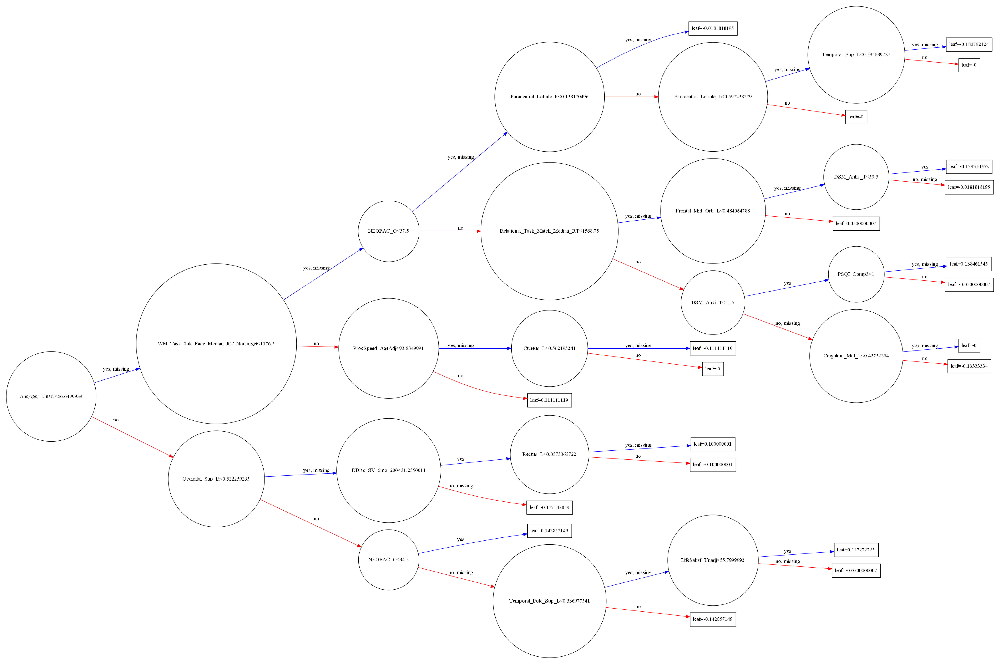

In [14]:
from xgboost import plot_tree
from matplotlib.pylab import rcParams
plt.style.use('default')
rcParams['figure.dpi'] = 200

plot_tree(gs.best_estimator_, num_trees=0, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(26.5,19)
plt.show()

# SHAP

In [15]:
import shap
shap.initjs()

In [16]:
explainer = shap.TreeExplainer(gs.best_estimator_)
shap_values = explainer.shap_values(X)

X_display, y_display = X, y

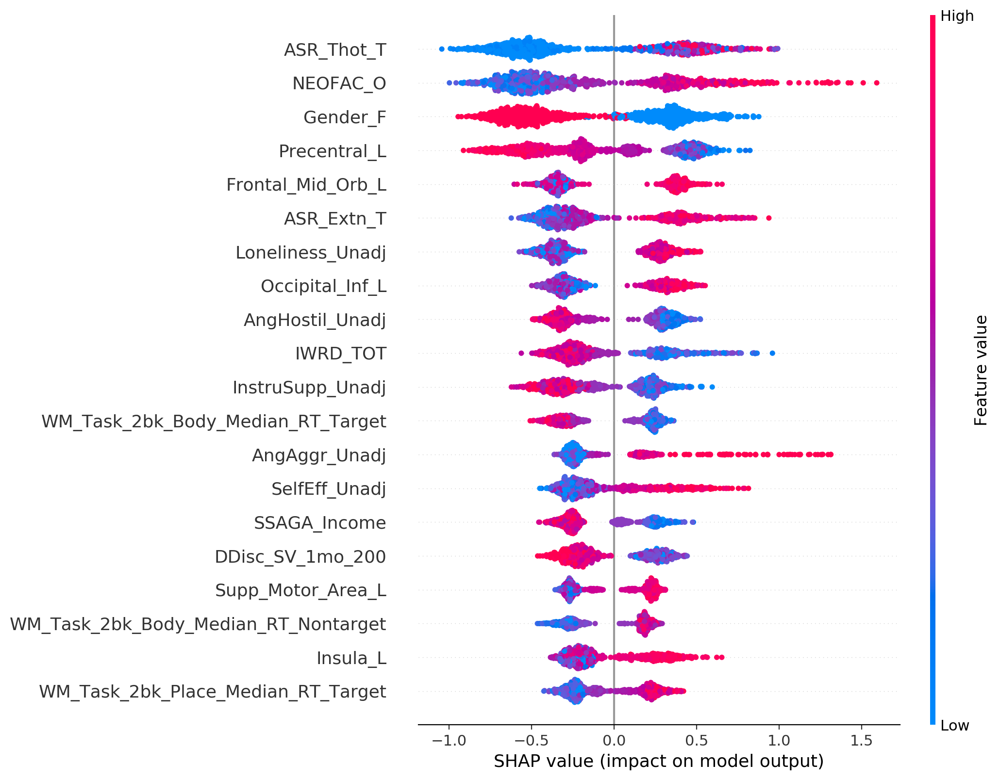

In [17]:
rcParams['figure.dpi'] = 120
plt.style.use('default')

shap.summary_plot(shap_values, X_display)

                                       feature  importance       std
345                                 ASR_Thot_T    0.505652  0.176484
294                                   NEOFAC_O    0.496953  0.216029
299                                   Gender_F    0.447588  0.187631
60                                Precentral_L    0.394040  0.195246
14                           Frontal_Mid_Orb_L    0.363653  0.057715
350                                 ASR_Extn_T    0.351904  0.127276
176                           Loneliness_Unadj    0.328287  0.077364
38                             Occipital_Inf_L    0.314321  0.071530
167                            AngHostil_Unadj    0.311086  0.070732
152                                   IWRD_TOT    0.279373  0.124794
180                           InstruSupp_Unadj    0.276993  0.111182
282          WM_Task_2bk_Body_Median_RT_Target    0.271645  0.067588
168                              AngAggr_Unadj    0.264942  0.167888
182                              S

103                              PSQI_Bathroom    0.000000  0.000000


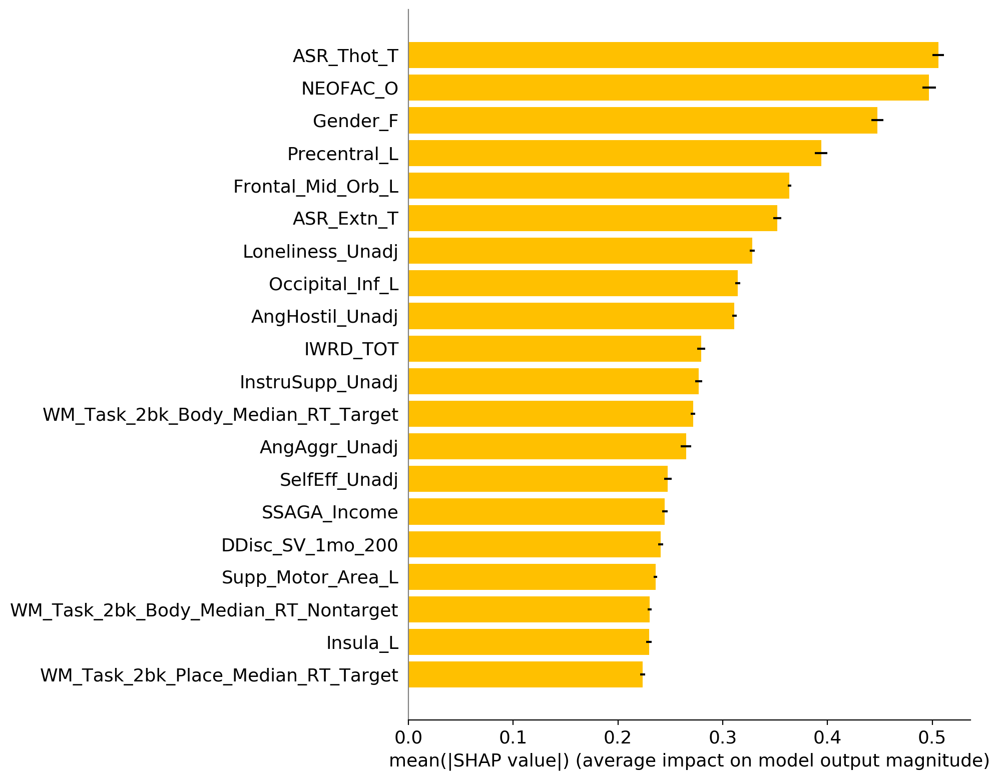

In [18]:
# feature importance
vals_mean= np.abs(shap_values).mean(0)
vals_std= np.abs(shap_values).std(0)

feature_importance = pd.DataFrame(list(zip(X.columns, vals_mean, vals_std)), 
                                  columns=['feature','importance', 'std'])
feature_importance.sort_values(by=['importance'], ascending=False, inplace=True)
with pd.option_context('display.max_rows', None):
    print(feature_importance)

    
# summary plot with standard error bars    
import math
matplotlib.rcParams.update({'font.size': 13})

feats = feature_importance['feature'][:20].reset_index()
means = np.array(feature_importance['importance'][:20])
stds = np.array(feature_importance['std'][:20])
y_pos =  np.arange(len(feats))

fig, ax = plt.subplots(figsize=(10,8))

ax.barh(y_pos, means, xerr=stds/math.sqrt(len(y)), align='center', color="#FFC000")
ax.set_yticks(y_pos)
ax.set_yticklabels(feats['feature'])
ax.invert_yaxis()
ax.set_xlabel('mean(|SHAP value|) (average impact on model output magnitude)')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('none')
ax.spines['left'].set_color('gray')
plt.tight_layout()
plt.show()

# SHAP dependence plots
# top 20

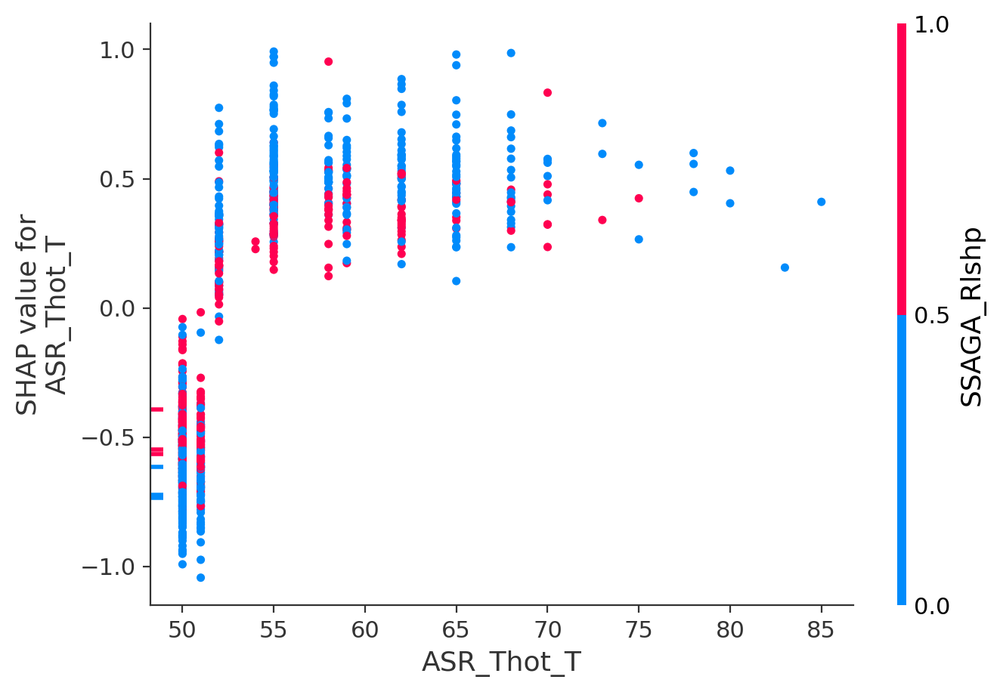

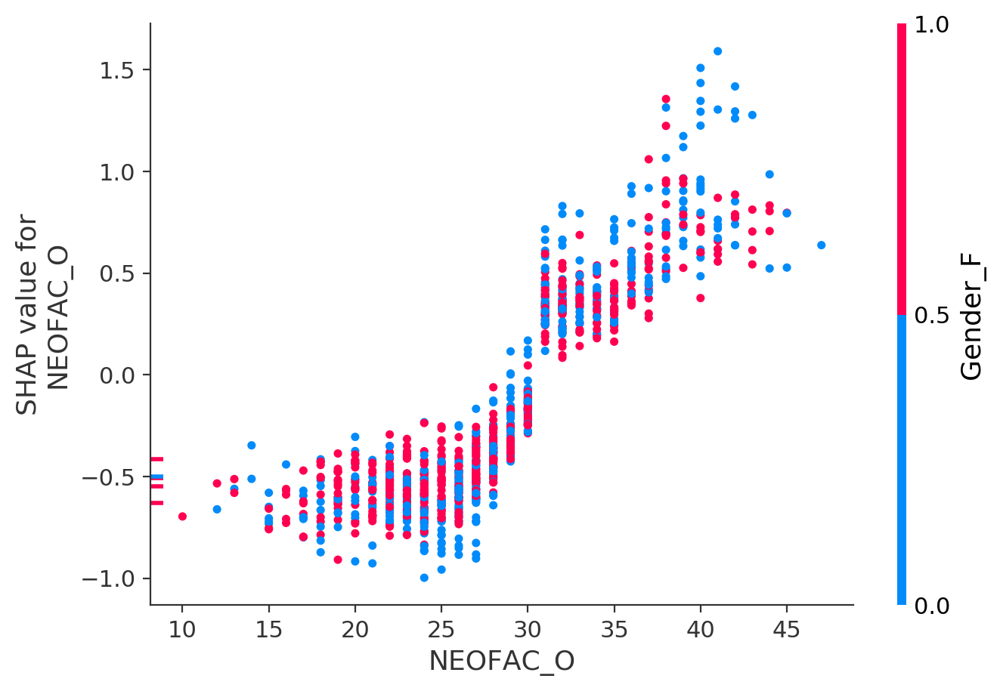

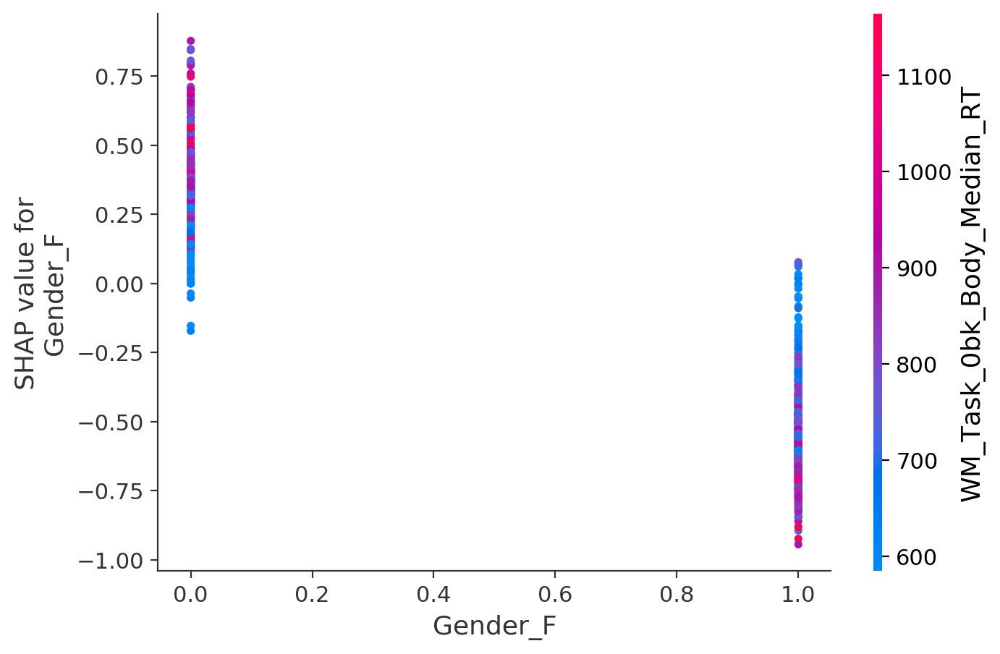

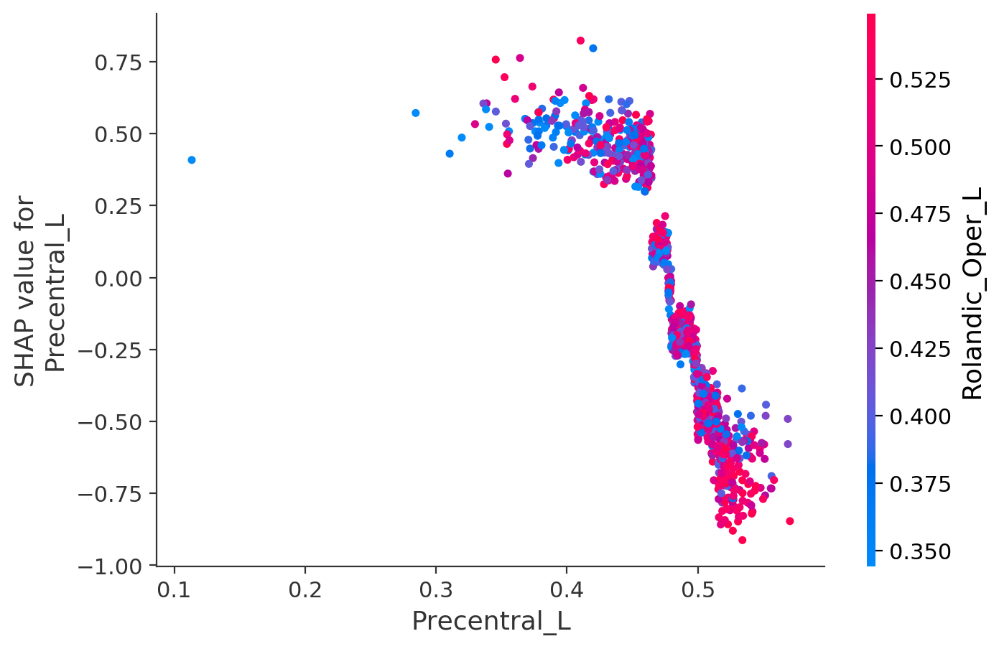

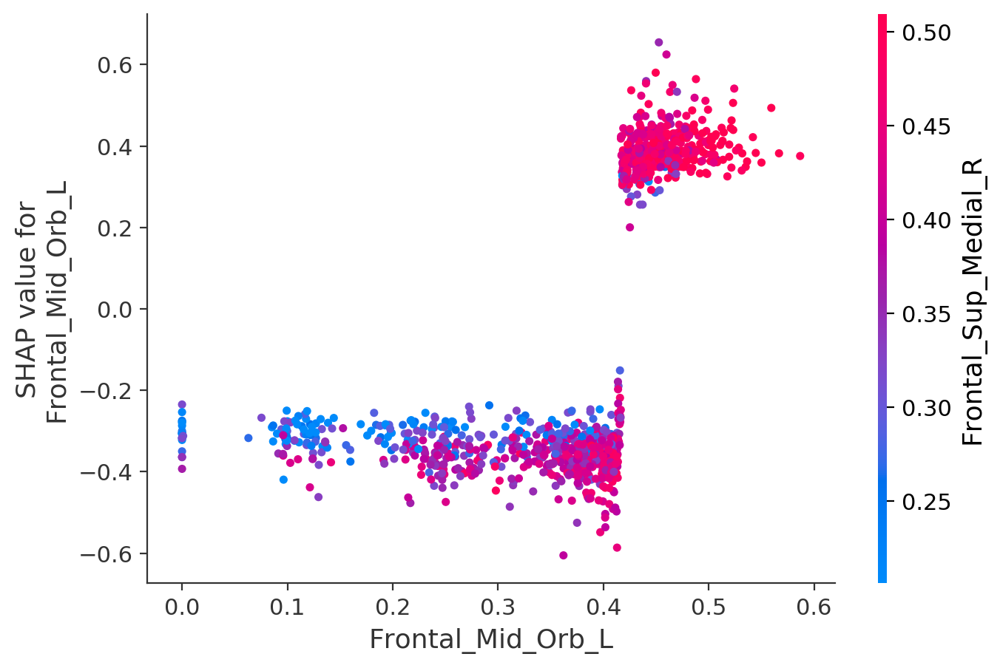

...

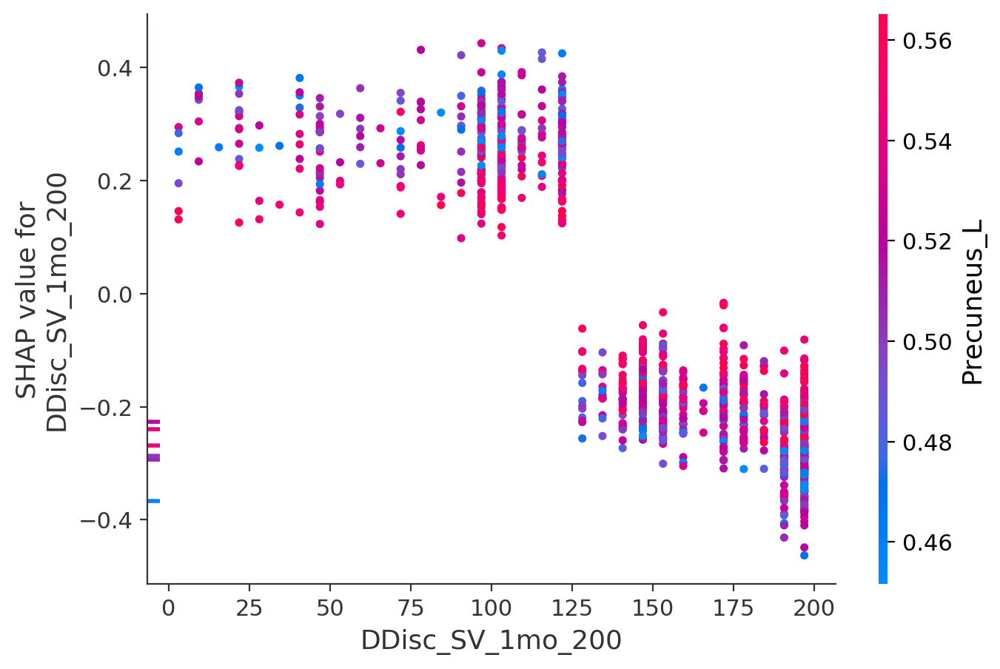

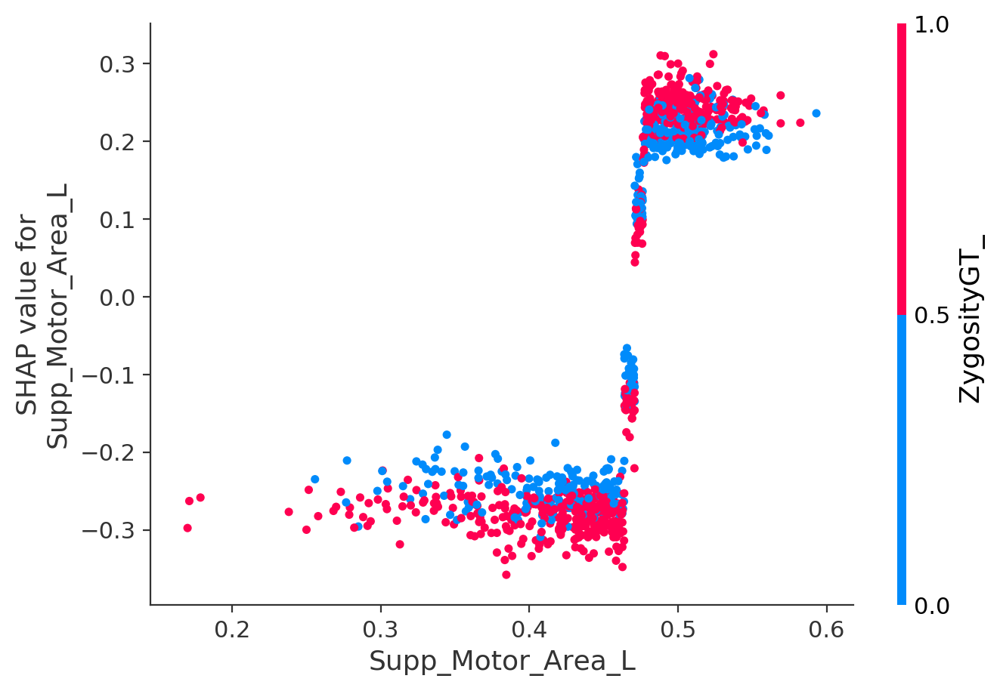

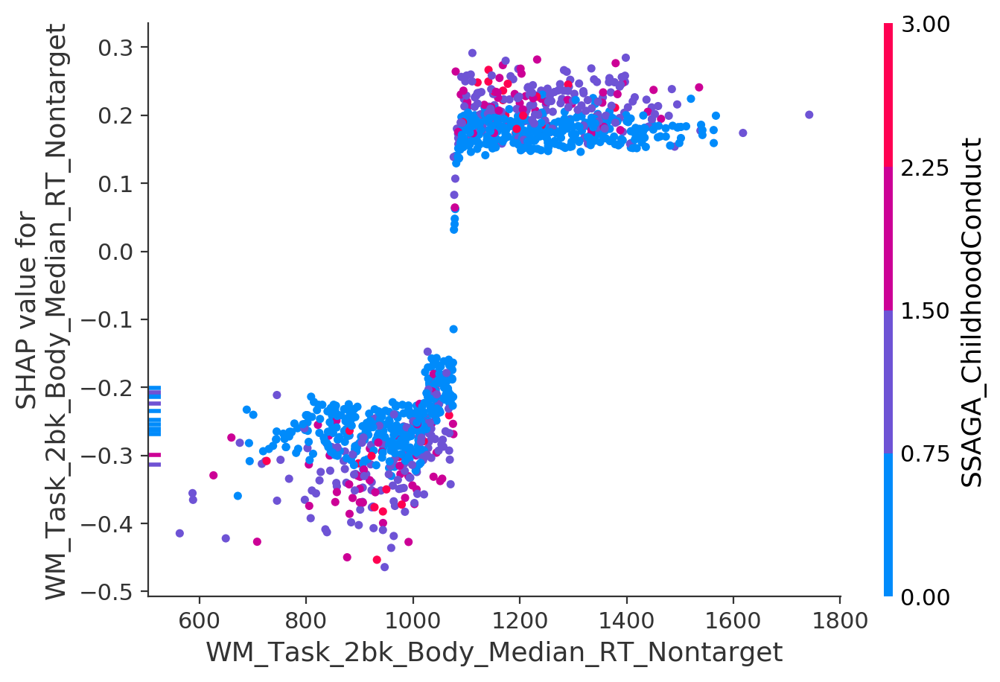

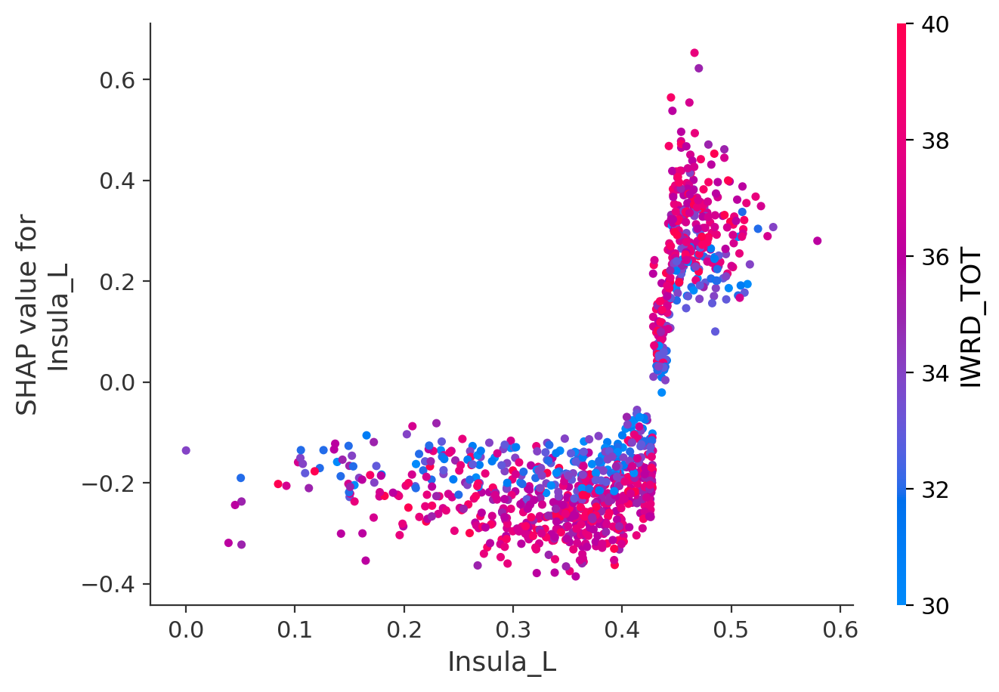

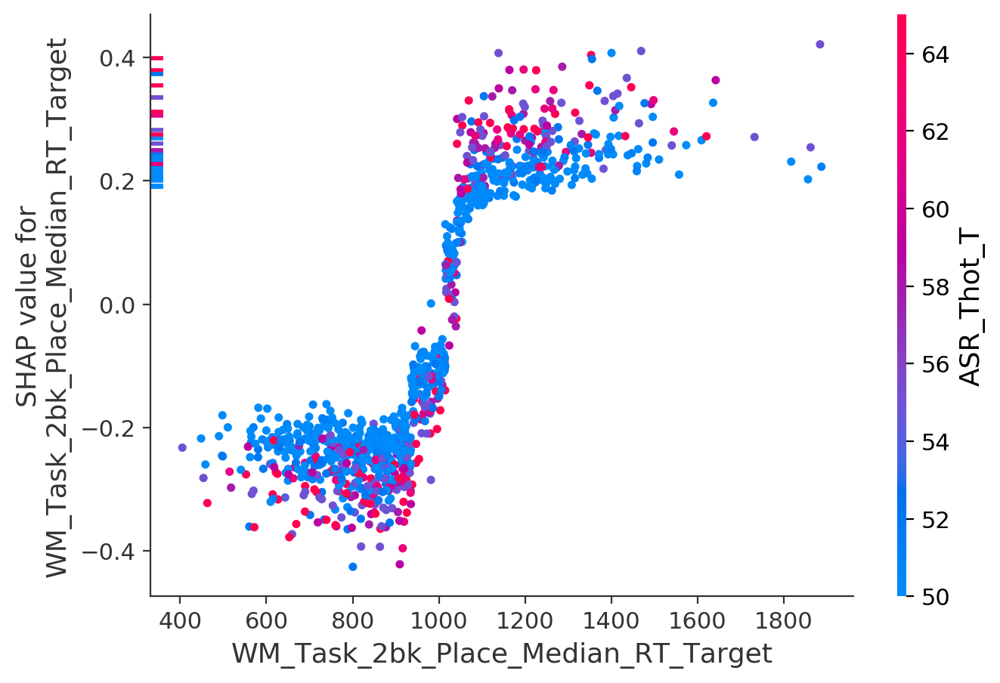

In [19]:
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))
for i in range(20):
    shap.dependence_plot(
        top_inds[i], 
        shap_values, 
        X, 
        display_features=X_display
    )

# SHAP interaction values
# top 20

In [20]:
shap_interaction_values = shap.TreeExplainer(gs.best_estimator_).shap_interaction_values(X)
joblib.dump(shap_interaction_values, 'hcp_times_binary1000x_shap_interaction_values_globalEfficiency_2scan_all.pkl')

['hcp_times_binary1000x_shap_interaction_values_globalEfficiency_2scan_all.pkl']

# SHAP main effect value plots 
# top 20

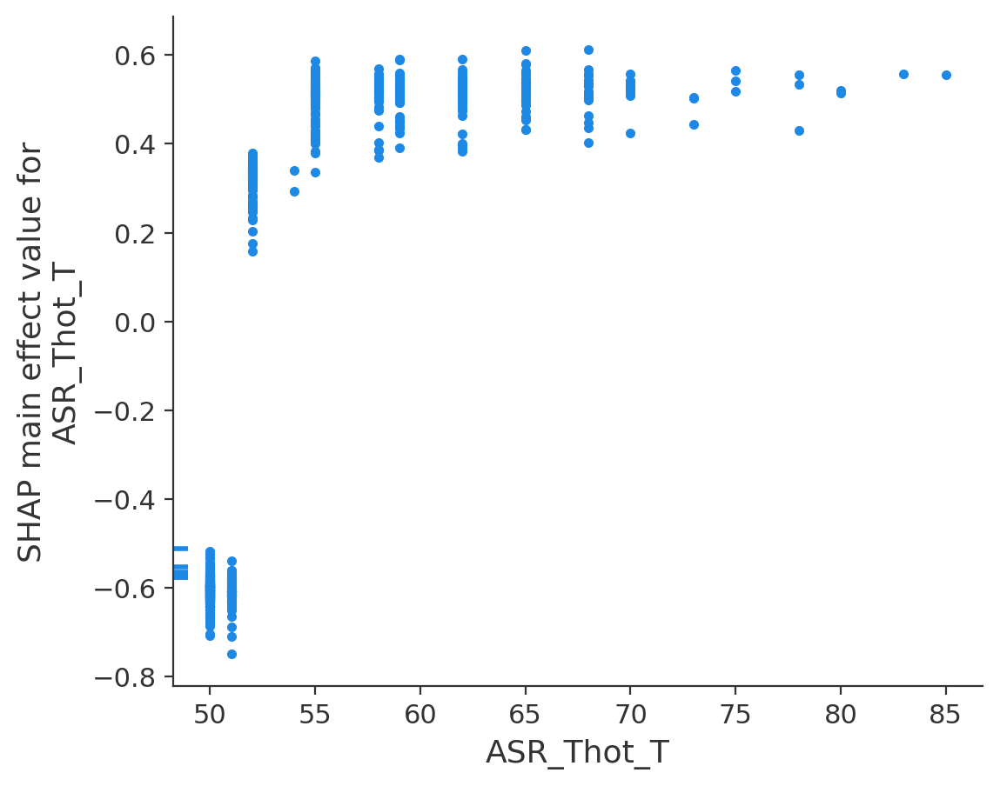

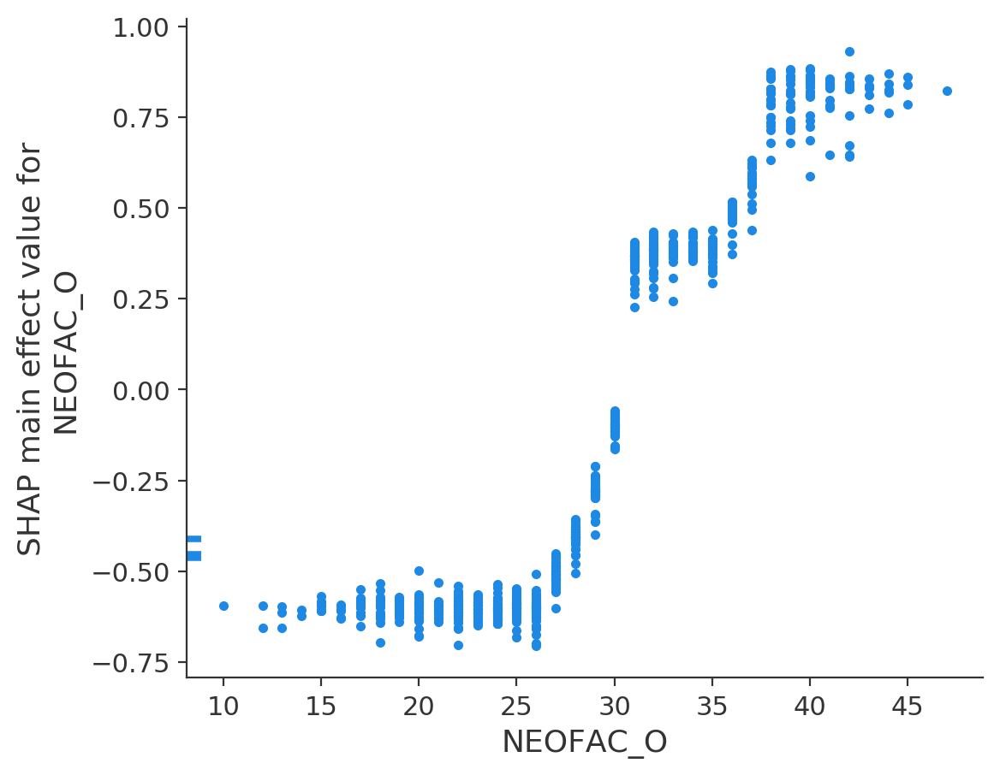

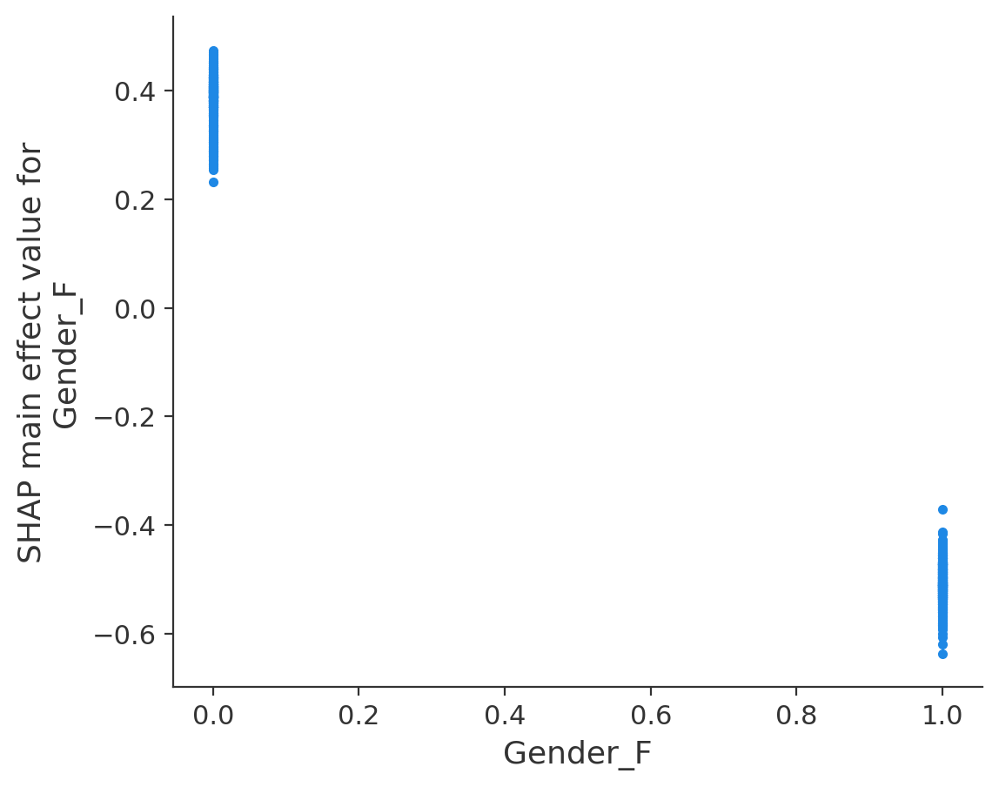

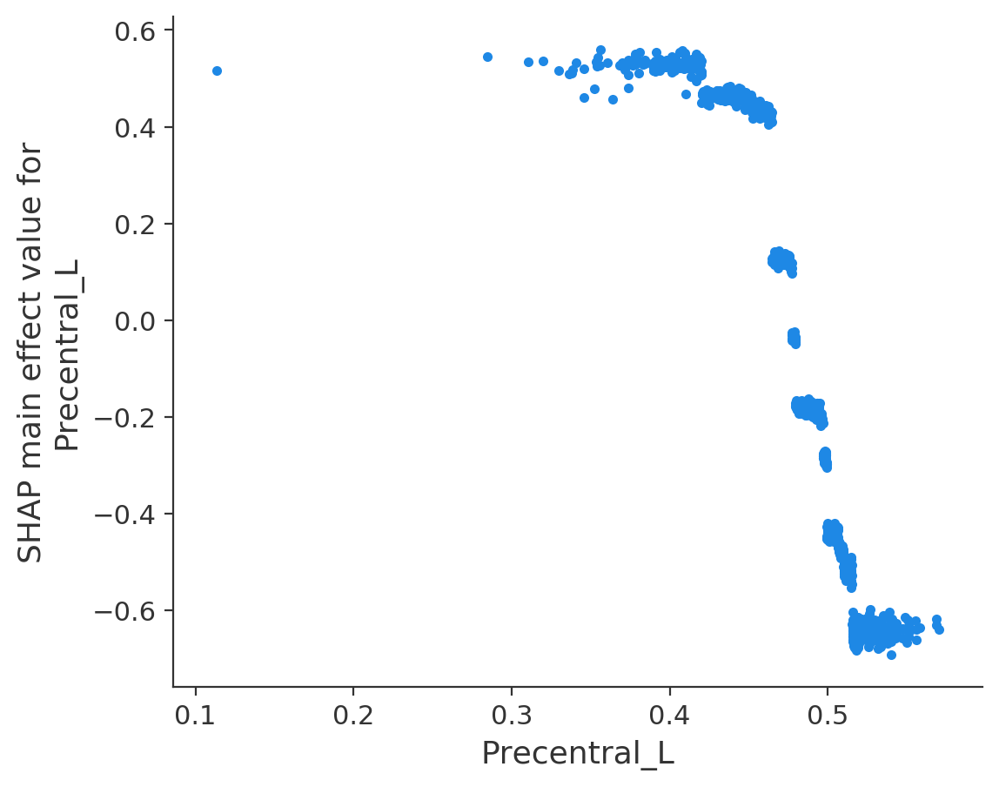

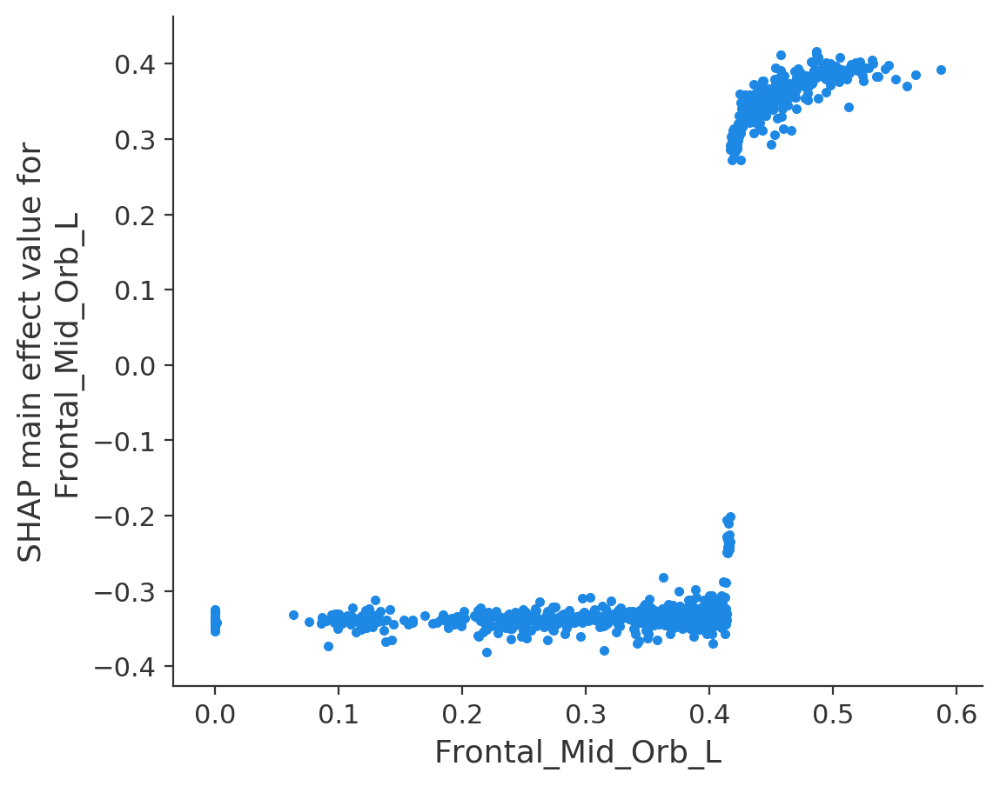

...

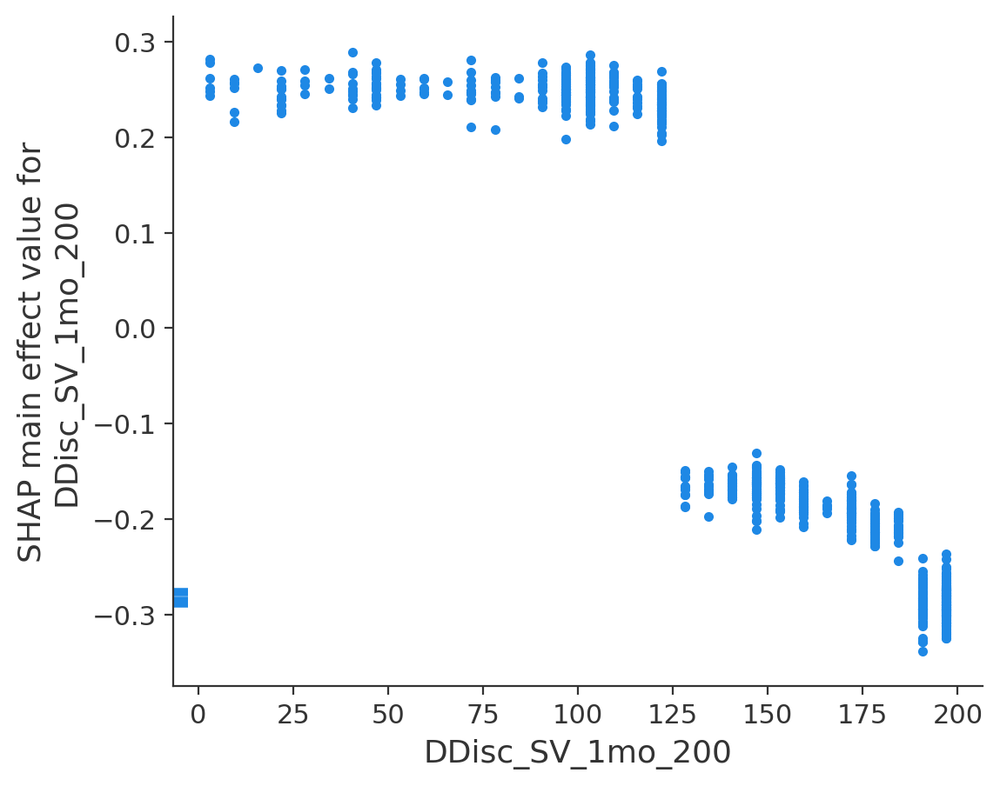

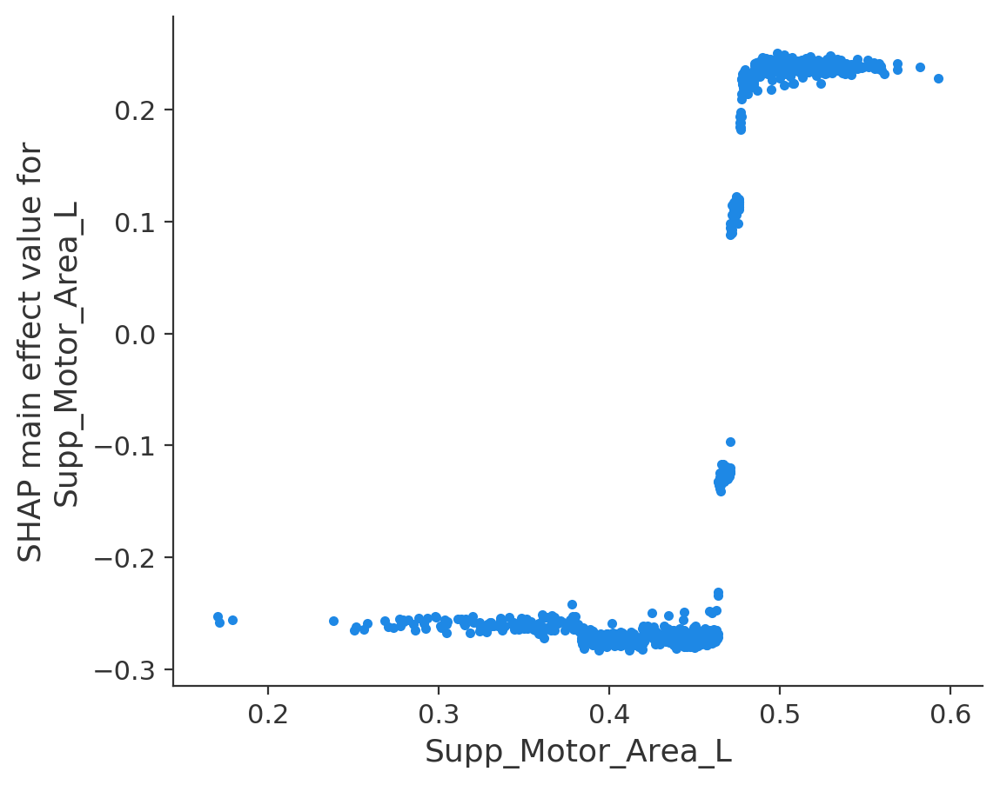

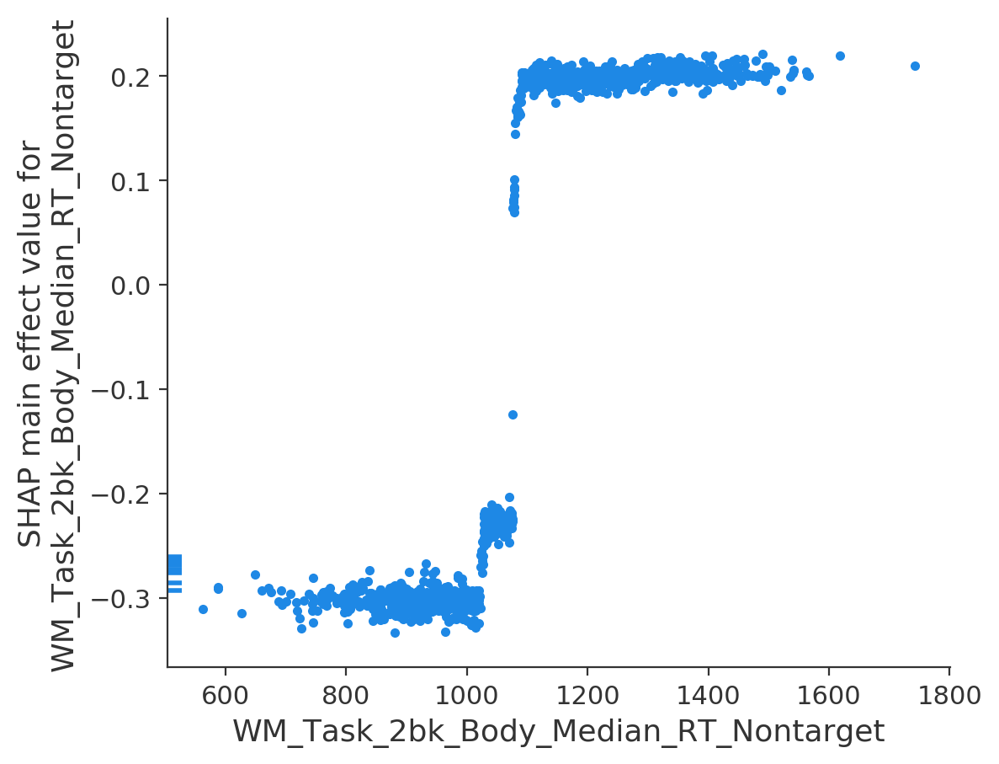

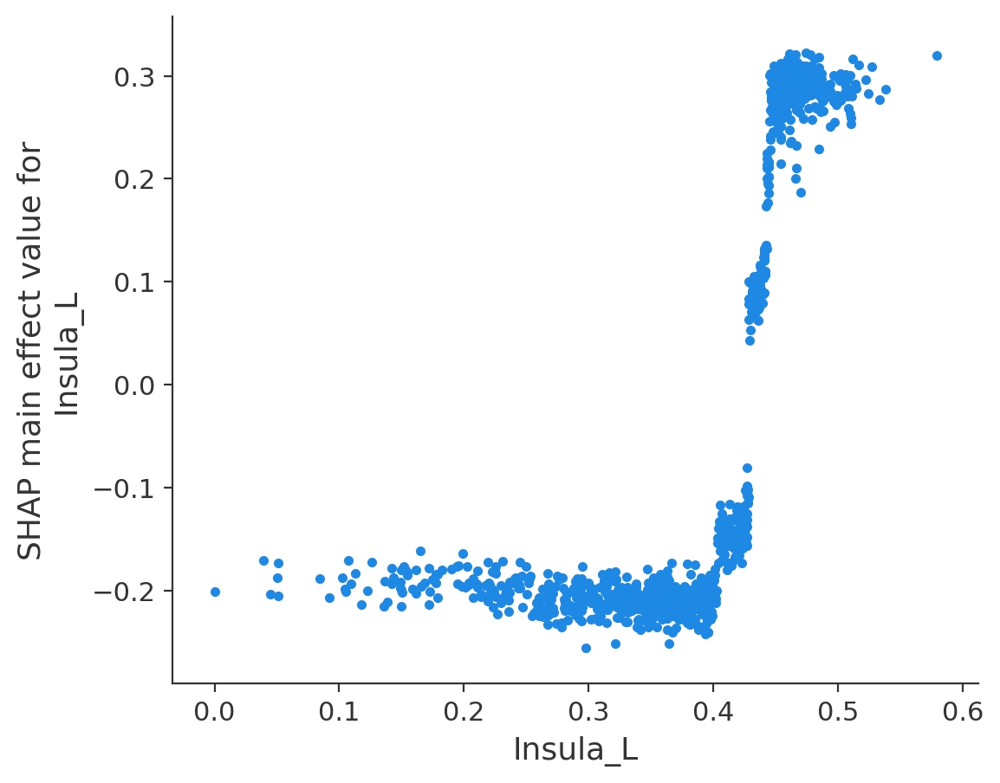

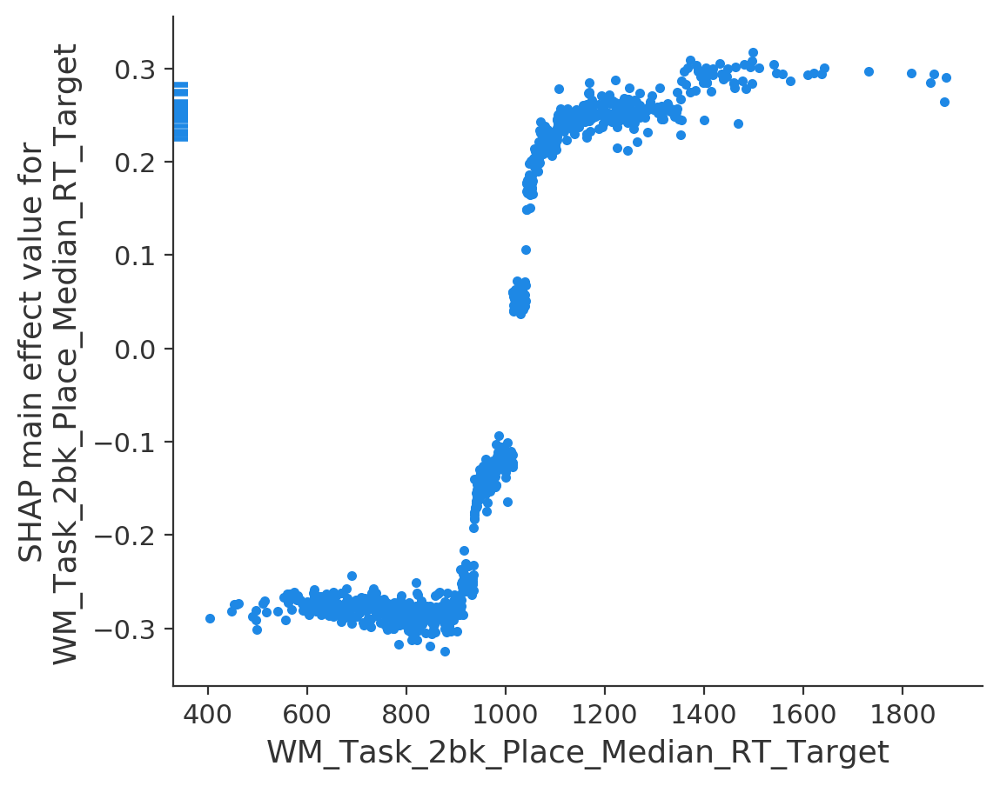

In [21]:
for i in range(20):
    shap.dependence_plot(
        (top_inds[i], top_inds[i]),
        shap_interaction_values, 
        X
    )

# SHAP interaction value plots
# top 20

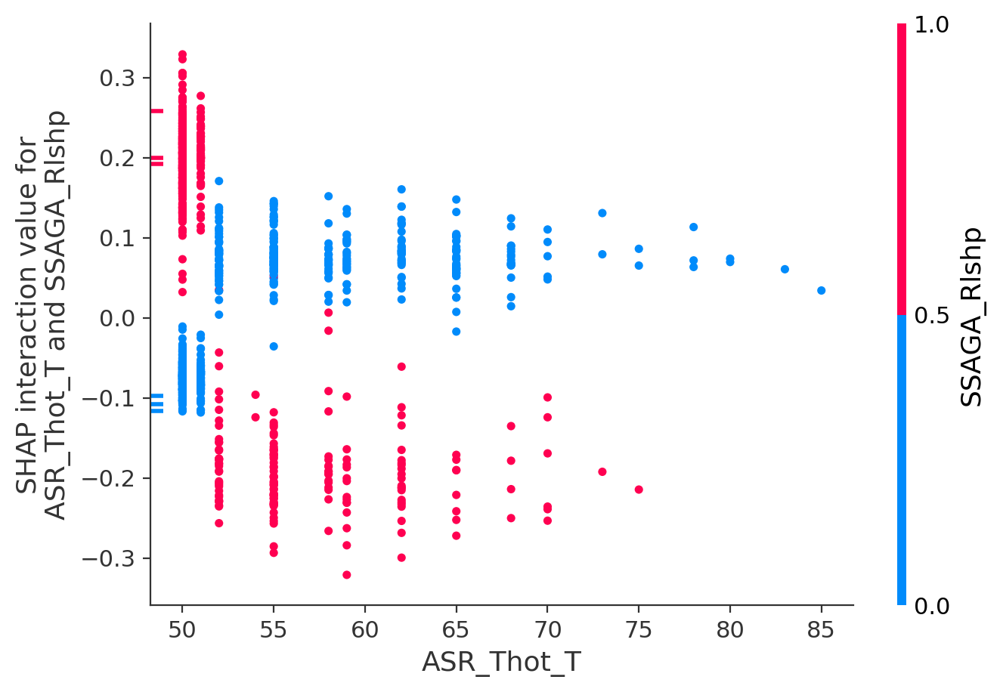

In [22]:
shap.dependence_plot(
    ('ASR_Thot_T', 'SSAGA_Rlshp'),
    shap_interaction_values, 
    X
)

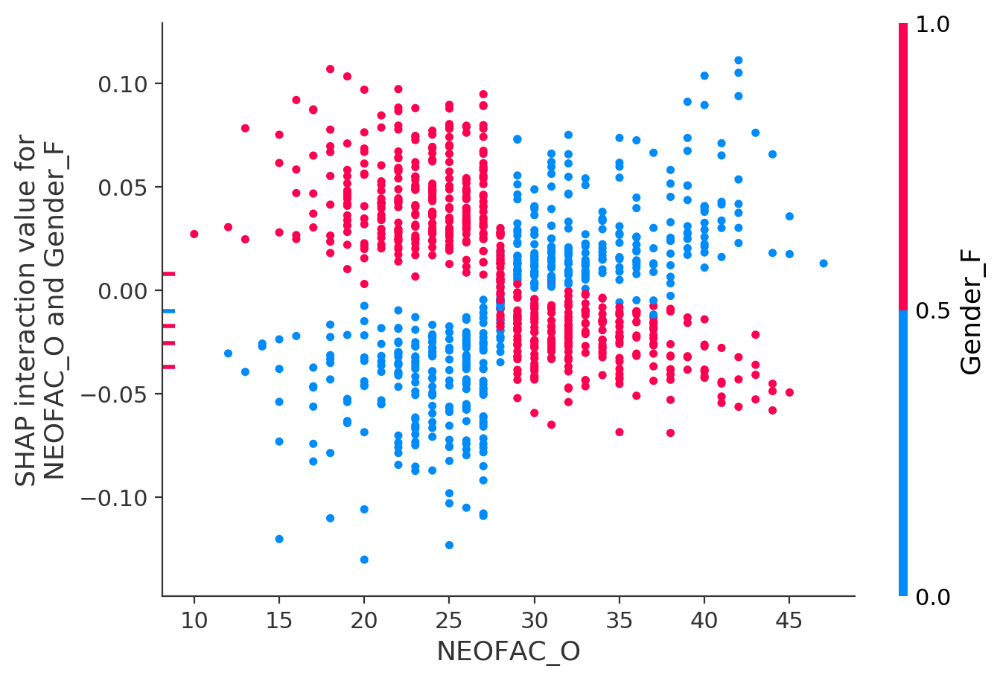

In [23]:
shap.dependence_plot(
    ('NEOFAC_O', 'Gender_F'),
    shap_interaction_values, 
    X
)

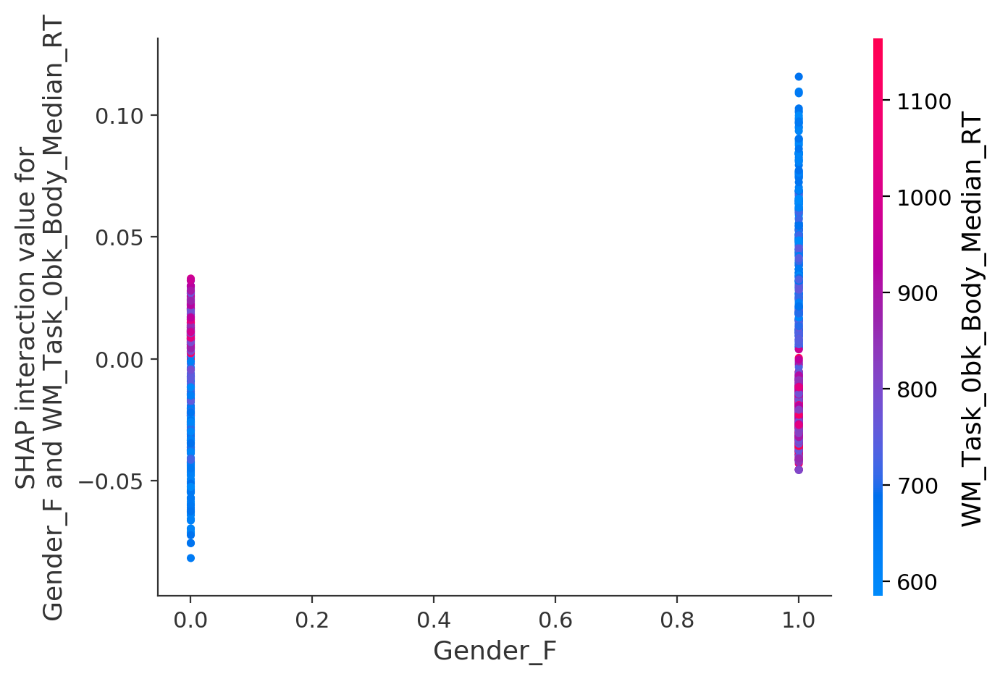

In [24]:
shap.dependence_plot(
    ('Gender_F', 'WM_Task_0bk_Body_Median_RT'),
    shap_interaction_values, 
    X
)

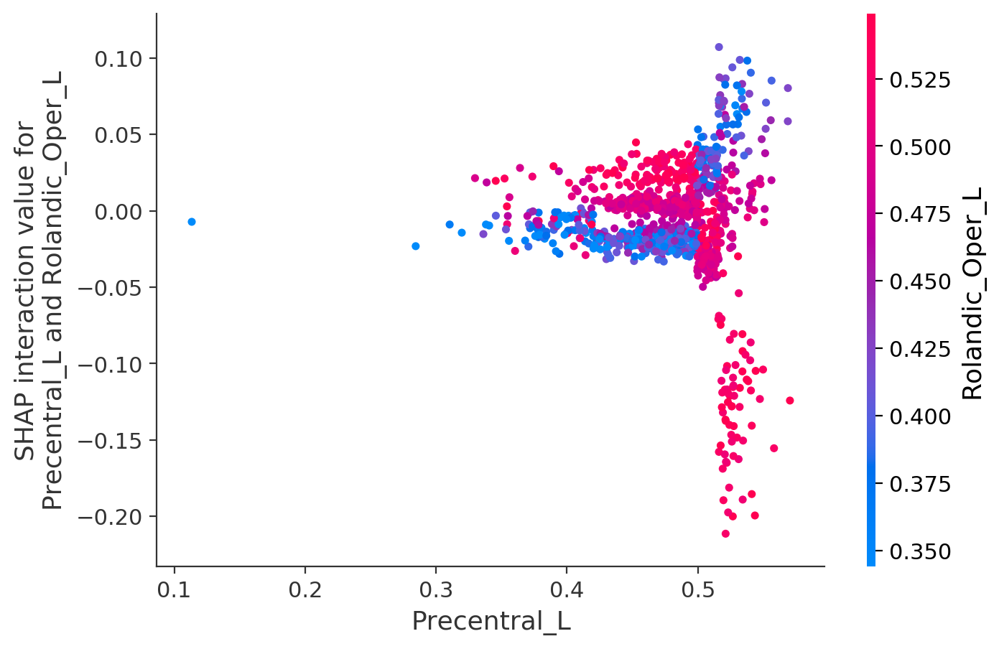

In [25]:
shap.dependence_plot(
    ('Precentral_L', 'Rolandic_Oper_L'),
    shap_interaction_values, 
    X
)

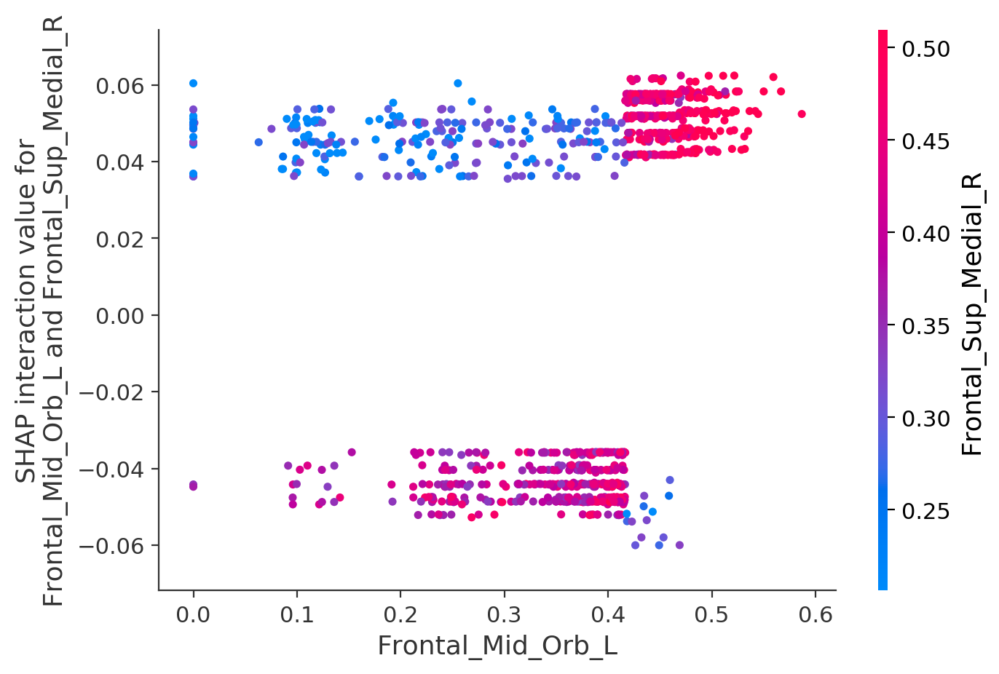

In [26]:
shap.dependence_plot(
    ('Frontal_Mid_Orb_L', 'Frontal_Sup_Medial_R'),
    shap_interaction_values, 
    X
)

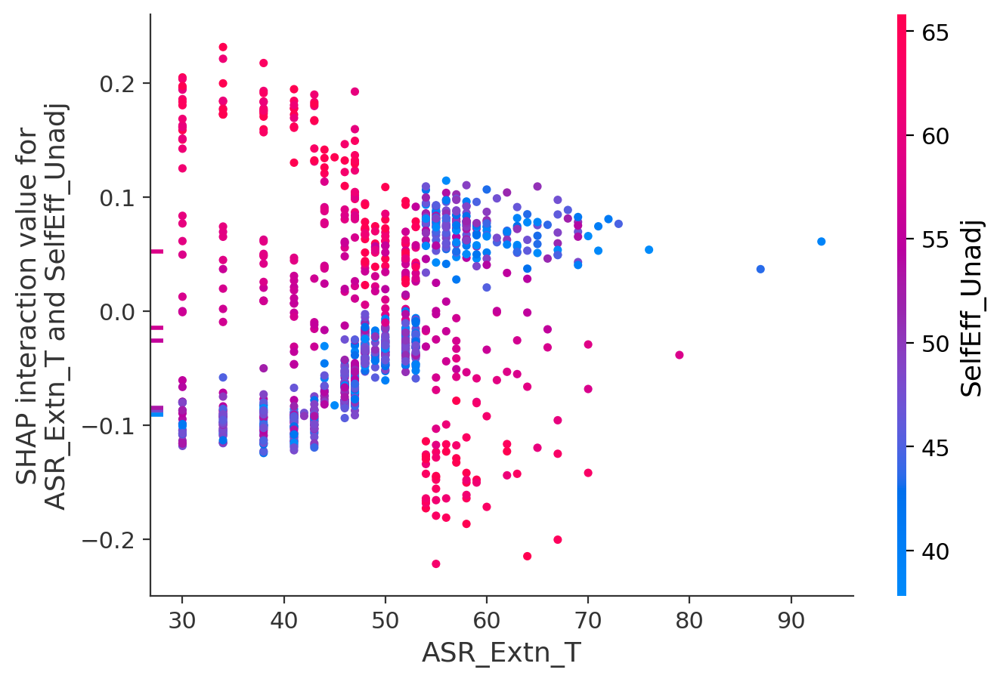

In [27]:
shap.dependence_plot(
    ('ASR_Extn_T', 'SelfEff_Unadj'),
    shap_interaction_values, 
    X
)

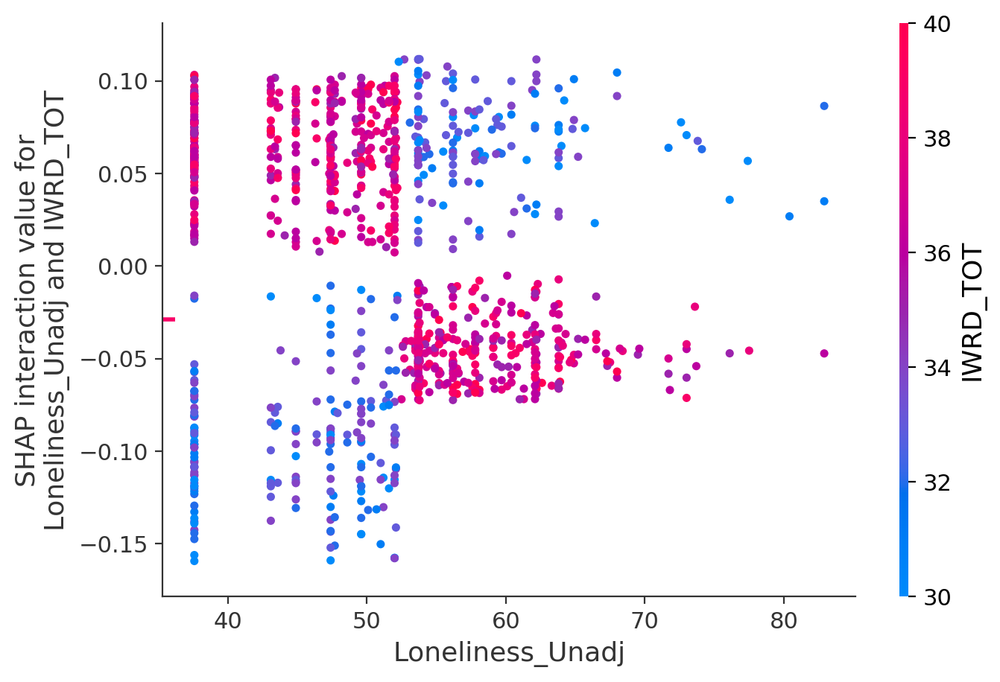

In [28]:
shap.dependence_plot(
    ('Loneliness_Unadj', 'IWRD_TOT'),
    shap_interaction_values, 
    X
)

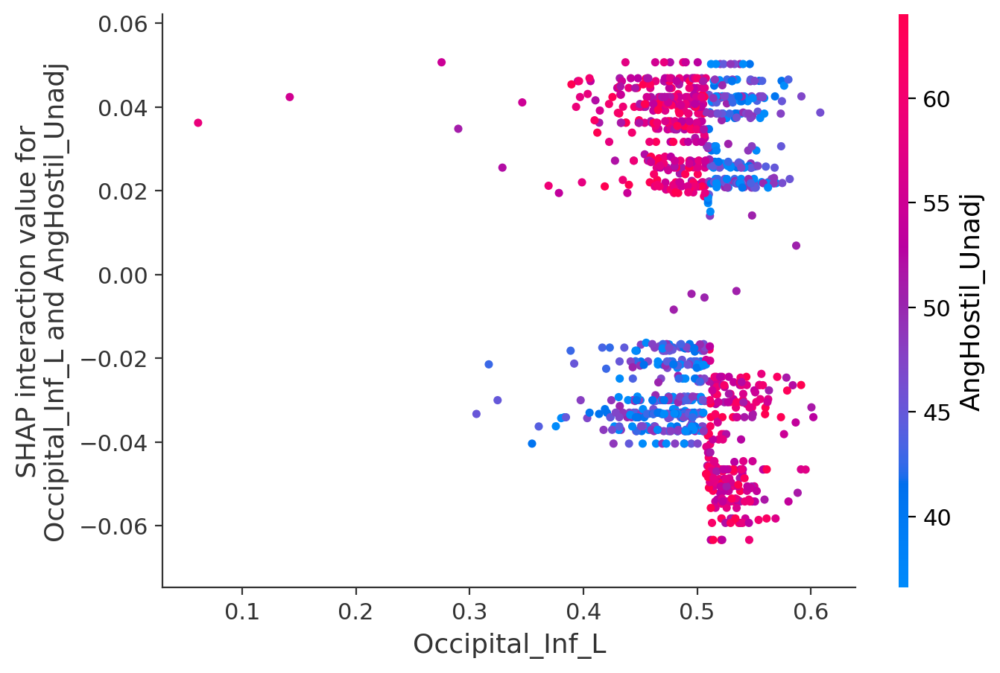

In [29]:
shap.dependence_plot(
    ('Occipital_Inf_L', 'AngHostil_Unadj'),
    shap_interaction_values, 
    X
)

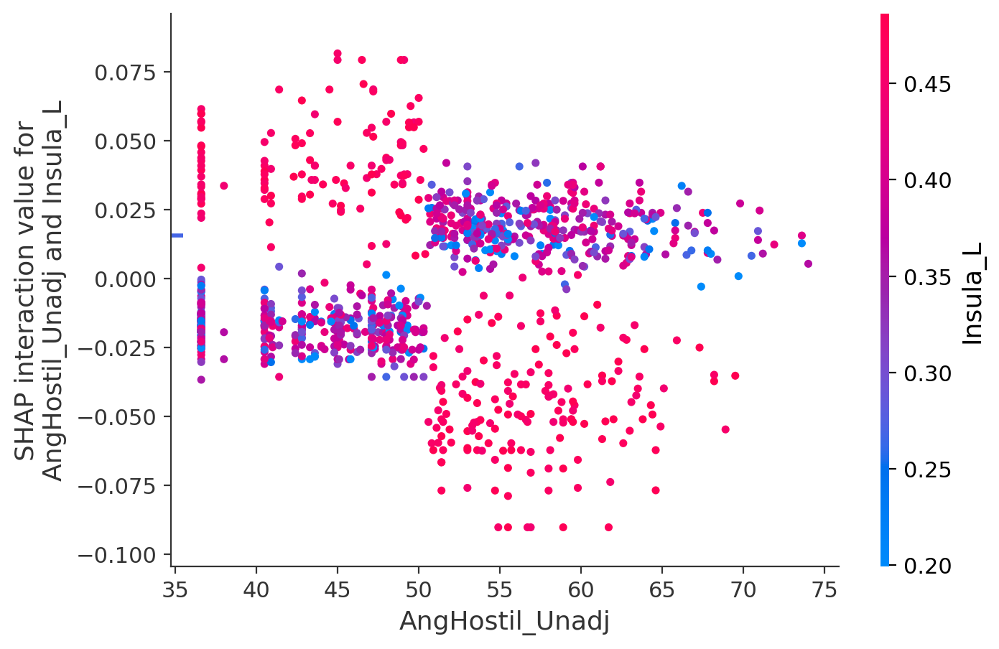

In [30]:
shap.dependence_plot(
    ('AngHostil_Unadj', 'Insula_L'),
    shap_interaction_values, 
    X
)

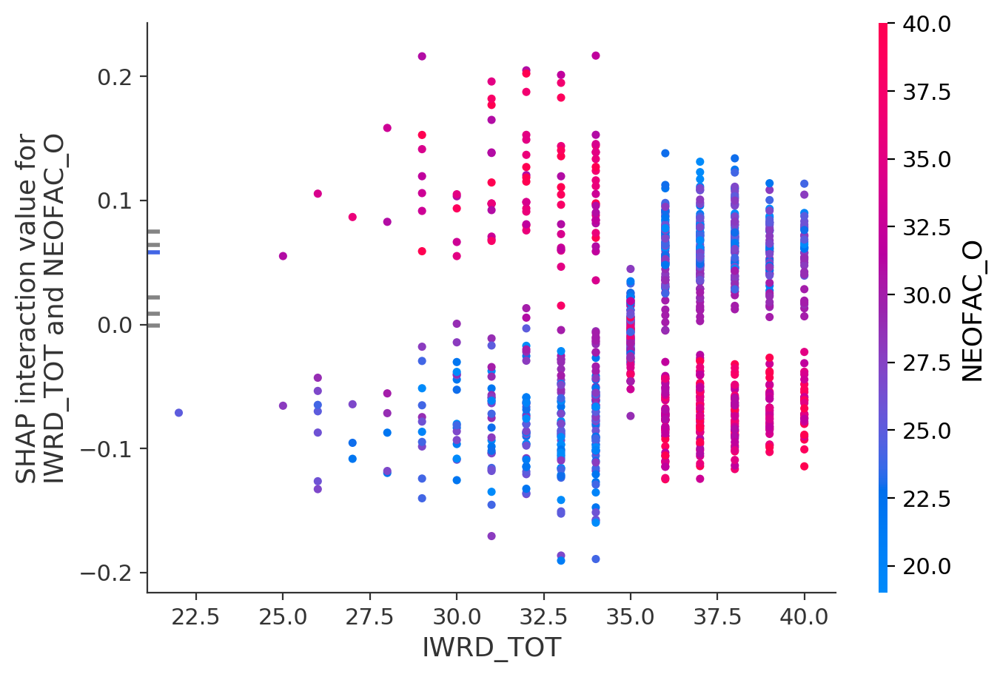

In [31]:
shap.dependence_plot(
    ('IWRD_TOT', 'NEOFAC_O'),
    shap_interaction_values, 
    X
)

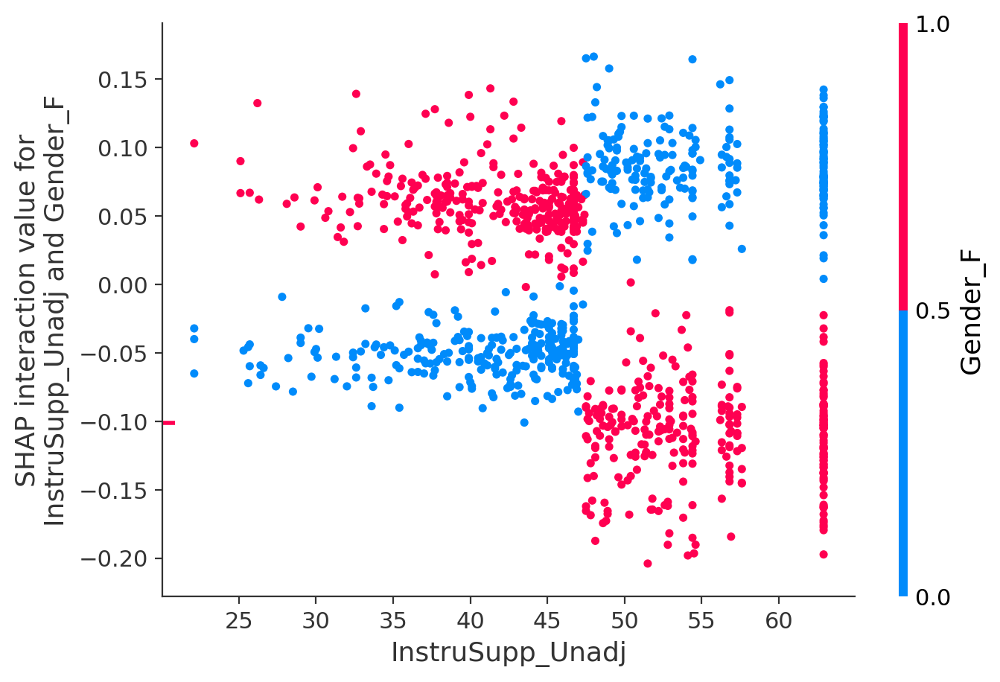

In [32]:
shap.dependence_plot(
    ('InstruSupp_Unadj', 'Gender_F'),
    shap_interaction_values, 
    X
)

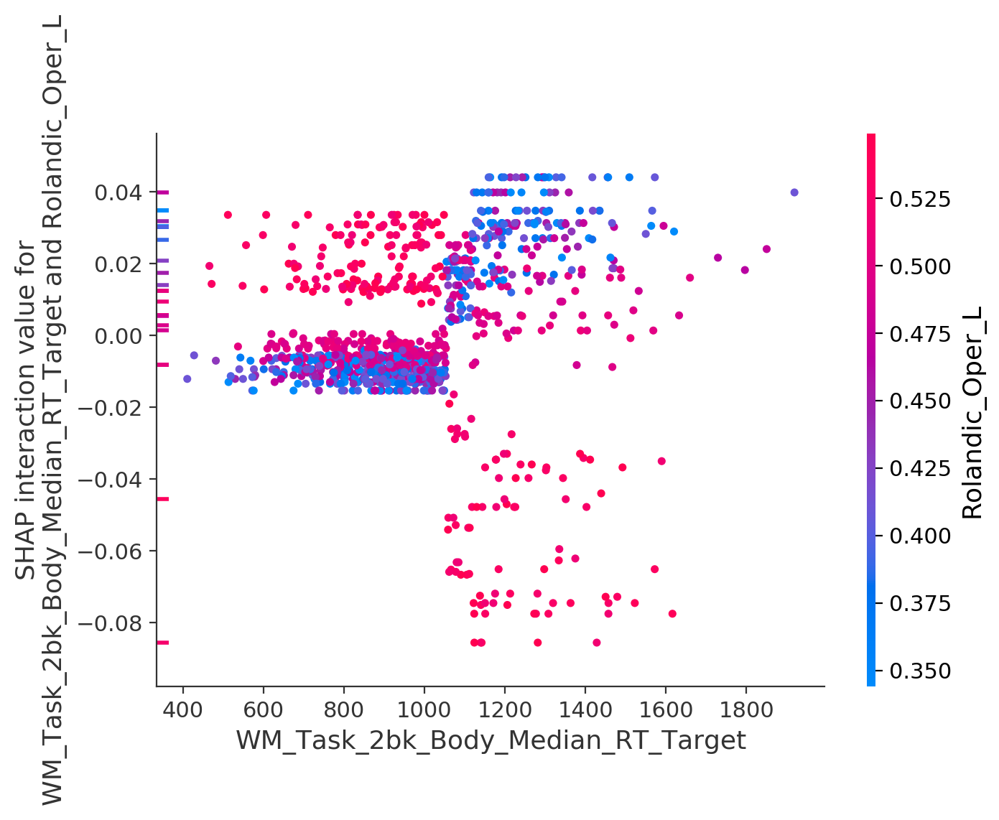

In [33]:
shap.dependence_plot(
    ('WM_Task_2bk_Body_Median_RT_Target', 'Rolandic_Oper_L'),
    shap_interaction_values, 
    X
)

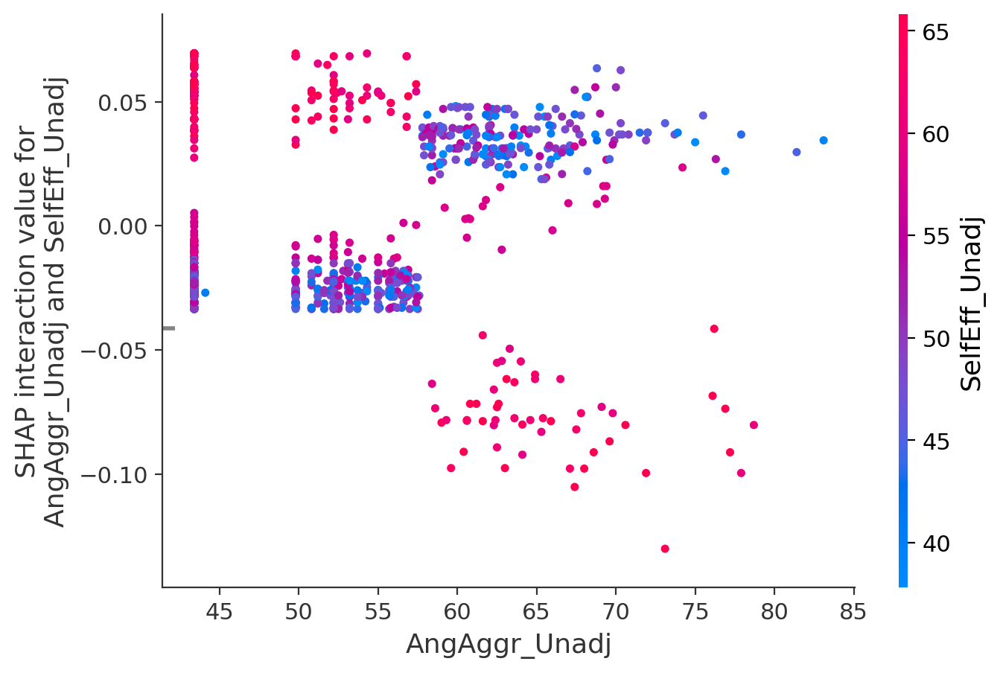

In [34]:
shap.dependence_plot(
    ('AngAggr_Unadj', 'SelfEff_Unadj'),
    shap_interaction_values, 
    X
)

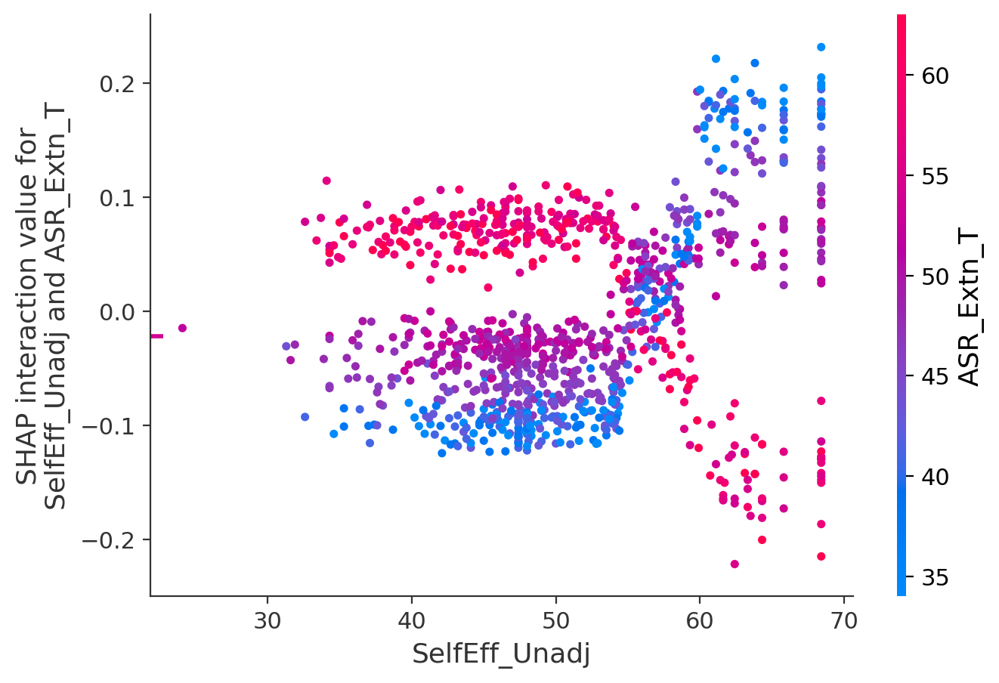

In [35]:
shap.dependence_plot(
    ('SelfEff_Unadj', 'ASR_Extn_T'),
    shap_interaction_values, 
    X
)

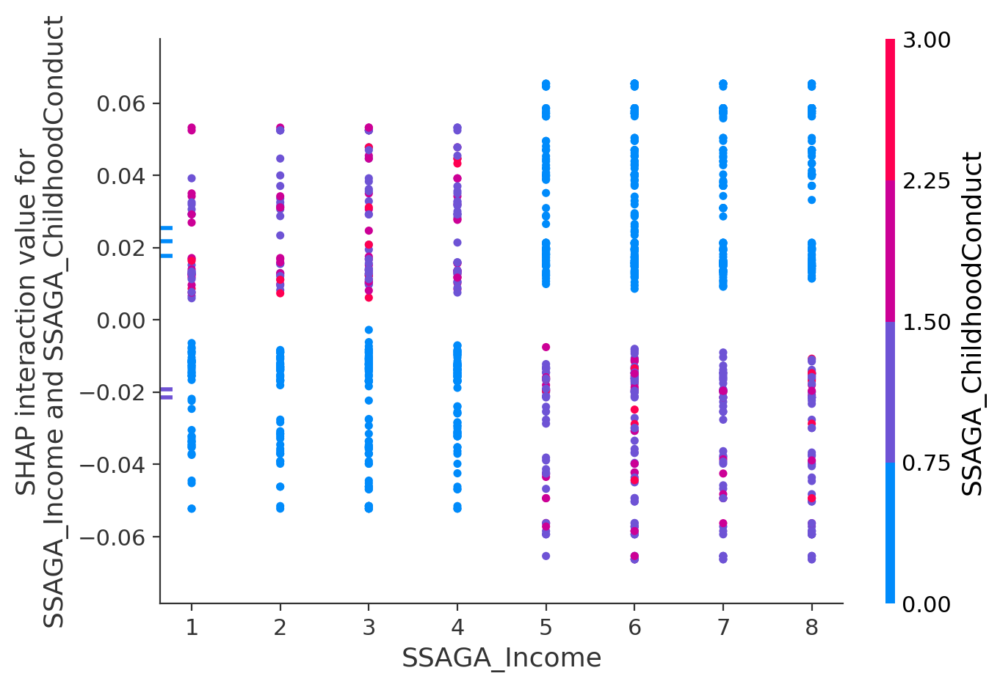

In [36]:
shap.dependence_plot(
    ('SSAGA_Income', 'SSAGA_ChildhoodConduct'),
    shap_interaction_values, 
    X
)

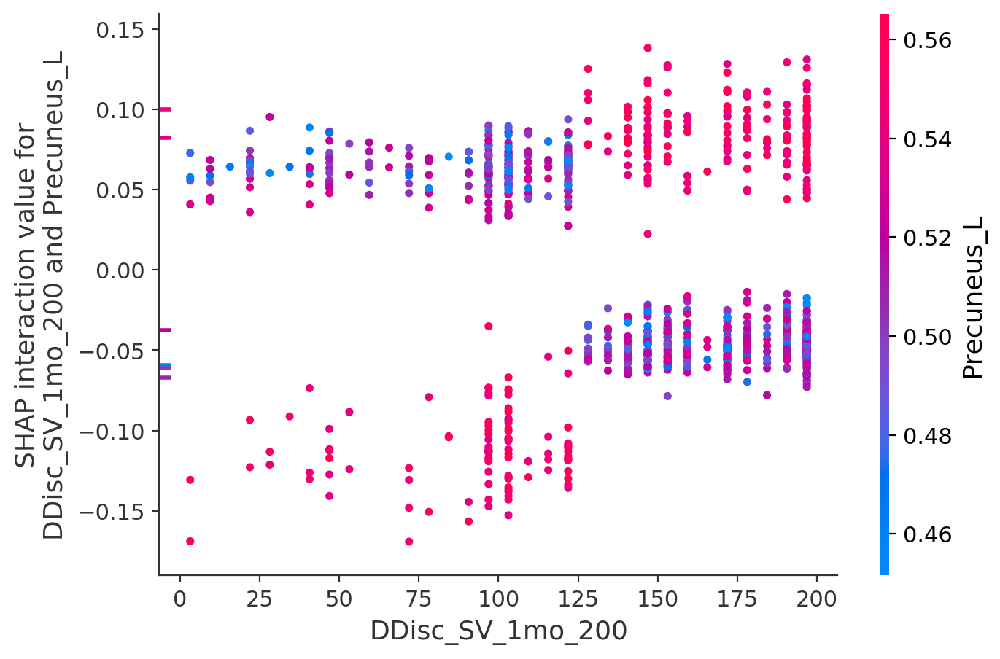

In [37]:
shap.dependence_plot(
    ('DDisc_SV_1mo_200', 'Precuneus_L'),
    shap_interaction_values, 
    X
)

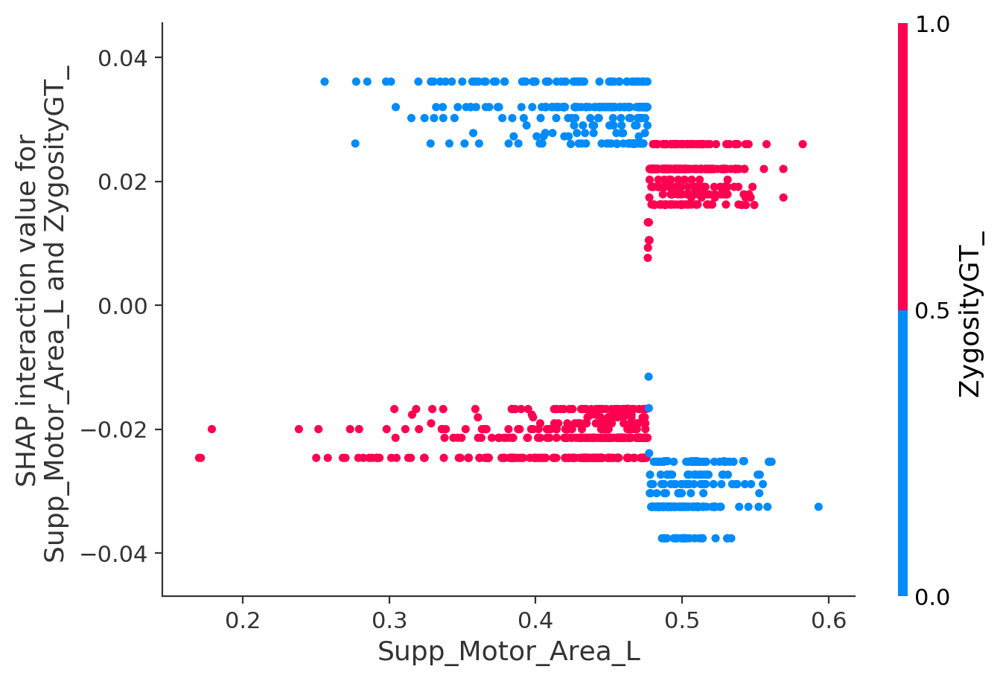

In [45]:
shap.dependence_plot(
    ('Supp_Motor_Area_L', 'ZygosityGT_ '),
    shap_interaction_values, 
    X
)

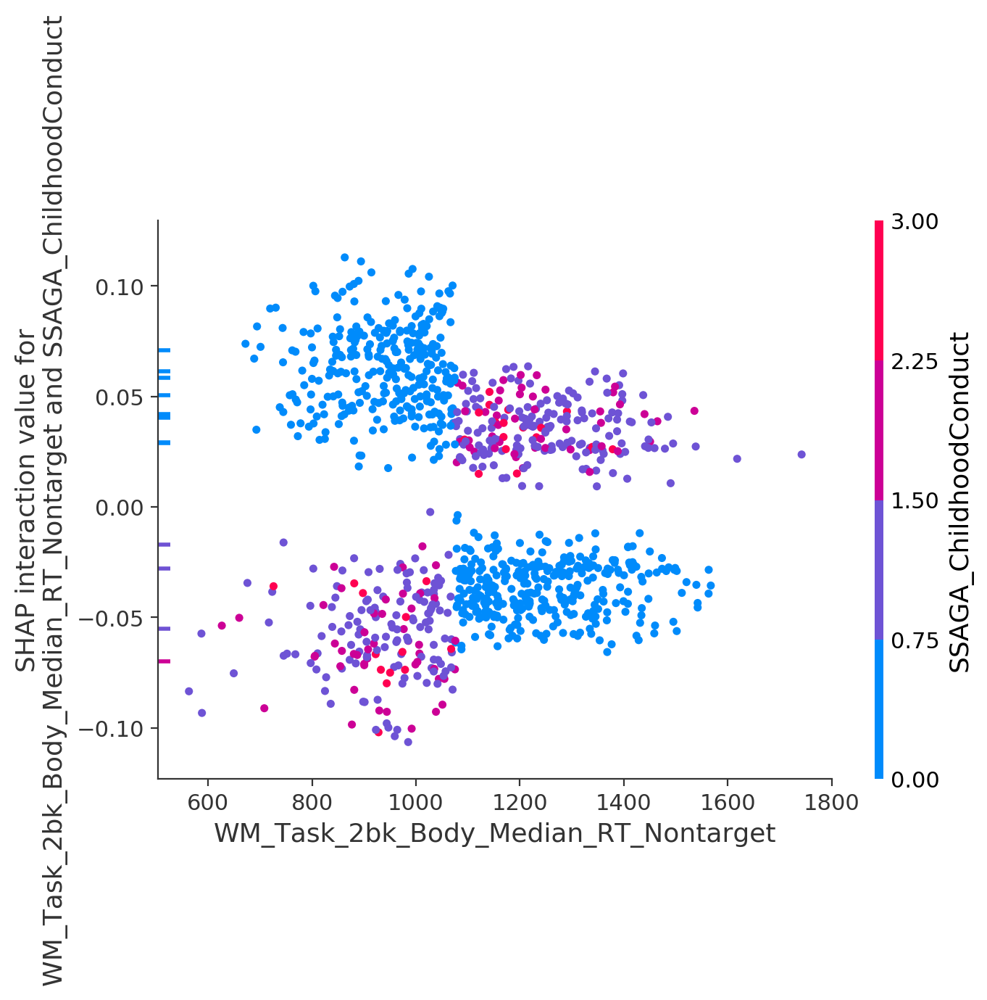

In [42]:
shap.dependence_plot(
    ('WM_Task_2bk_Body_Median_RT_Nontarget', 'SSAGA_ChildhoodConduct'),
    shap_interaction_values, 
    X
)

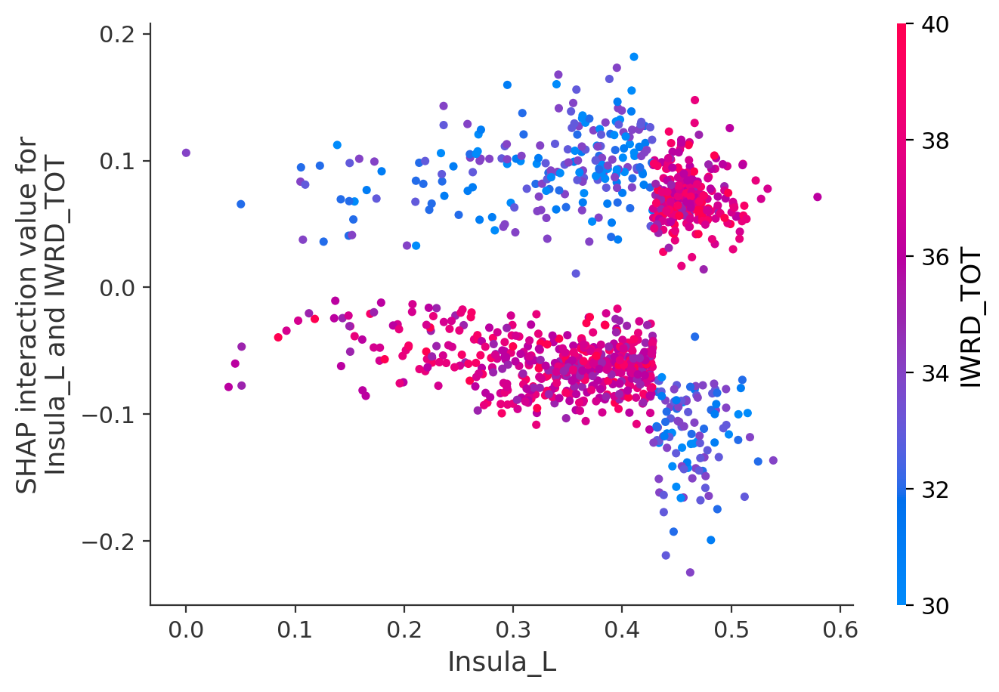

In [43]:
shap.dependence_plot(
    ('Insula_L', 'IWRD_TOT'),
    shap_interaction_values, 
    X
)

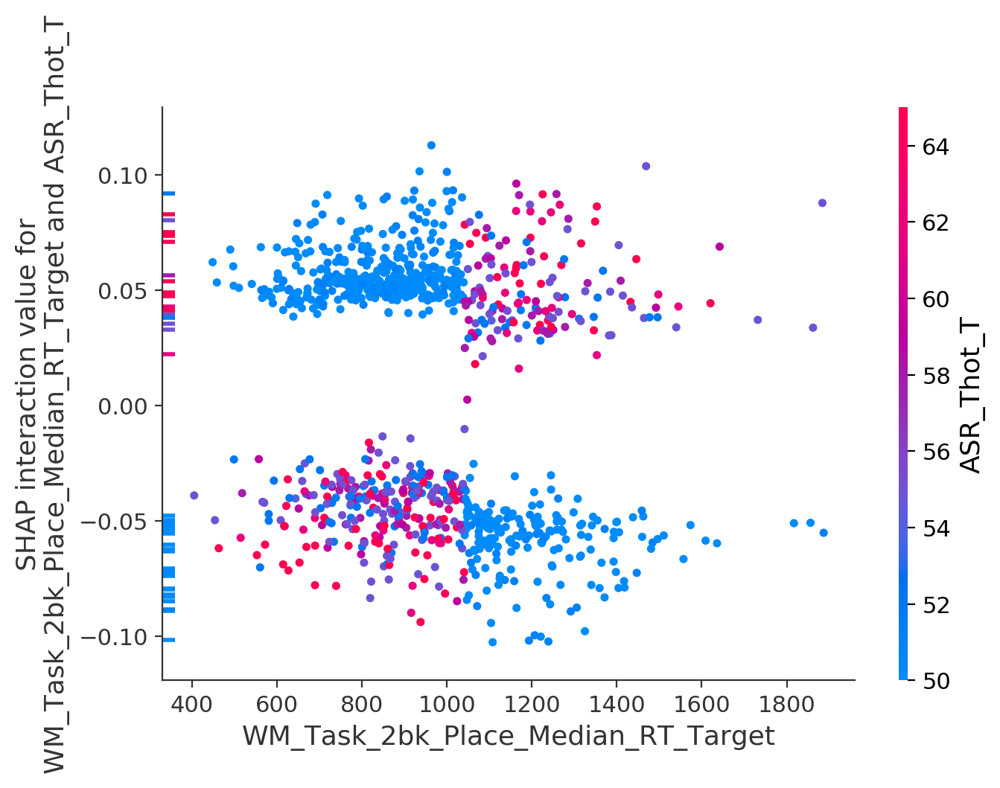

In [44]:
shap.dependence_plot(
    ('WM_Task_2bk_Place_Median_RT_Target', 'ASR_Thot_T'),
    shap_interaction_values, 
    X
)